# **ST445 Group Assignment: Macro Variables contribution on explaining the performance of the US stock market**

### Group members: 50714, 49872, 49775  

**!!!!! Important Announcement for Evaluator: !!!**

--> Please download our project repository and open the Jupyter notebook.

To download:
* **Go to Code → Download ZIP**
  
* **Open the FINAL_ST445_GROUP_PROJECT.ipynb file** in Jupyter.

**Note on Live Plots:**

* Please note that it may take around 1 minute for the data point labels to appear for the live plots.
  
* To view the labels right away, **just click on the cell that has plot**. This will let you `see the labels immediately` when you **place your cursor** on the data points.

<img src="data/INTUS.png" style = 'width:1000px;height:300px'>

### **NOTEBOOK GUIDE**

### **ENVIRONMENT**

Our project incorporates interactive and live animated plots using the powerful `plotly.express` library. However, due to GitHub's limitations, these plots are not optimally displayed within Jupyter Notebooks hosted on the platform. For the best visual and interactive experience, we highly recommend exploring the `HTML` version of our project.

### **GRAPHICS**

As part of our creative approach, we used relevant `images` and `GIFs` to enhance the overall presentation of our work. These assets, stored in `.png` and `.giphy.gif` formats, can be found in the `data` folder within the project repository. To ensure the smooth execution of corresponding cells, we recommend running this notebook on a local machine in the same working directory (`data` directory) as the project.

### **Import important libaries**

In our project, we mainly use the data collected from `yfinance` and `FRED`:

- `yfinance` : A popular open source library to retrieve the financial data available on Yahoo Finance

- `fredapi` : The API of FRED - a web service that allows people to retrieve economic data from the FRED® and ALFRED® websites hosted by the Economic Research Division of the Federal Reserve Bank of St. Louis

First, we need to install the packages from `yfinance` and `fredapi`:



In [12]:
! pip install yfinance # Installation of yfinance
! pip install fredapi # Installation of fredapi

Then, we will import the important libraries we used when doing this project:

In [14]:
import os
import pandas as pd
import numpy as np
import datetime as dt        # ---- DATA MANIPULATION AND CLEANING PACKAGES -----#
from math import pi

from fredapi import Fred
import sqlite3              # ---- DATA ACQUISITION PACKAGES ----#
import yfinance as yf

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns         # ---- VISUALISATIONS AND EDA PACKAGES ---- #
import plotly.graph_objects as go
import plotly.subplots as sp
from matplotlib.animation import FuncAnimation

from statsmodels.tsa.seasonal import seasonal_decompose    # --- STATISTICAL COMPUTING PACKAGE --- #

from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from statsmodels.graphics.tsaplots import plot_ccf        # --- MODELING PACKAGES --- #
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve
from sklearn.model_selection import learning_curve, GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, cross_validate, KFold, StratifiedKFold, train_test_split
from tabulate import tabulate
from joblib import Parallel, delayed
from sklearn.utils import resample
from sklearn.decomposition import TruncatedSVD

<style>
a:visited {
    color: blue;  /* Change 'blue' to any colour you prefer */
}
</style>


### **Table of Contents**

- [1. Introduction](#1-introduction)

  - [1.1. Background](#11-background)
  - [1.2. The rationale of data selection](#12-the-rationale-of-data-selection)
  - [1.3. Research questions](#13-research-questions)

- [2. Data collection & Preparation](#2-data-collection--preparation)
  - [2.1. Data collection](#21-data-collection)
    - [2.1.1. Reading from excel file](#211-reading-from-excel-file)
    - [2.1.2. Retrieving data from API](#212-retrieving-data-from-api)
    - [2.1.3. Reading from SQLite database](#213-reading-from-sqlite-database)
    - [2.1.4. Data collection results](#214-data-collection-results)
  - [2.2. Data cleaning](#22-data-cleaning)
    - [2.2.1. Cleaning Trading data](#221-cleaning-trading-data)
    - [2.2.2. Cleaning Macroeconomic indicators data](#222-cleaning-macroeconomic-indicators-data-df_combined)
  - [2.4. Data manipulation](#24-data-manipulation)

- [3. Exploratory Data Analysis (EDA)](#3-exploratory-data-analysis-eda)

- [4. Modelling](#4-modelling)
  - [4.1. Motivation](#41-motivation)
  - [4.2. Hyperparameter Tuning](#42-hyperparameter-tuning)

- [5. Conclusion](#5-conclusion)

- [6. References](#6-references)


# **1. Introduction**

<img src = "data/US-STOCKMARKET.png" style = 'width:1000px;height:300px'>

### **1.1. Background**

Stock market is the aggregation of buyers and sellers of stocks (also called shares), which represent ownership claims on businesses. Although there are many participants in the stock market with different aims, the main reason for trading is to earn profits for their investment. To increase chances of successful investment, the participants need to consider a wider range of variables, including macroeconomics – related to the business environment of the invested companies, microeconomics – related to the specific fundamentals of the companies. Therefore, apart from understanding the fundamentals, understanding the effects on macroeconomics variables to the performance of stock market can help the investors to better inform their investment decisions.

In this project, we aim to investigate the effect of macroeconomic variables to the performance of the stock market. Specifically, our work is to employ a classification-based ML framework, incorporating bootstrap sampling and feature selection techniques, to evaluate the effects of key macroeconomic variables — such as interest rates, inflation, unemployment, GDP growth, and consumer sentiment — on the performance of the stock market. We use the US stock market as a representative of the stock market in this study.


### **1.2. The rationale of data selection**

Founded in 1792, the US equity market is one of the longest markets which experienced a long period of growth, and is considered as the most active stock markets among the world. Many investors using the US equity stock market as a benchmark of the growth in their own investment. Therefore, the performance of this market is considered as the benchmark of the Equity market in the world.

To track the performance of the US stock market, we are usually interested in the stock indexes, of which three most prominent are S&P 500 (S&P 500), Nasdaq Composite Index (NASDAQ), and the Down Jones Industrial Index (DJIA).

In [23]:
# Heatmap the data of total market cap based on country
marketcap = pd.read_html("https://en.wikipedia.org/wiki/List_of_countries_by_stock_market_capitalization")[0].iloc[:,0:2] #get data from webcrawling data in Wikipedia
marketcap.columns = marketcap.columns.droplevel(1)
marketcap.columns = ["country","total_market_cap"]
marketcap_data = [int(item.split("[")[0].replace(",","")) for item in marketcap["total_market_cap"]]
marketcap["total_market_cap"] = marketcap_data

#draw heat map - geographical data based on total market cap using plotly
fig = px.choropleth(
    marketcap,
    locations="country",
    locationmode="country names",
    color="total_market_cap",
    color_continuous_scale="Blues",
    title="Market Capitalization by Country",
    labels={"total_market_cap": "Total market capitalisation"}
)

fig.update_layout(geo=dict(showframe=False, showcoastlines=True),width=1200, height=800)
fig.show()

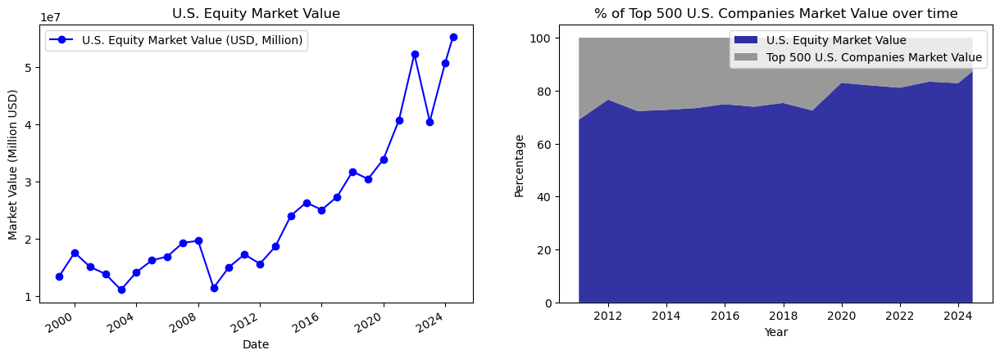

In [24]:
# Plot market cap of US vs market cap of top 500 market cap - line chart
marketcap_us = pd.read_html("https://siblisresearch.com/data/us-stock-market-value/")[0] #get the data from website 
marketcap_us = pd.DataFrame(marketcap_us)
marketcap_us["Date"] = pd.to_datetime(marketcap_us["Date"])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 5))

marketcap_us.plot(x = "Date", y = "U.S. Equity Market Value (USD, Million)", ax = ax1, color = 'blue', marker = 'o')
ax1.set_title("U.S. Equity Market Value")
ax1.set_xlabel("Date")
ax1.set_ylabel("Market Value (Million USD)")

# Draw the 100% stacked bar shaded area for top 500 companies
top500percentage = marketcap_us[marketcap_us["Date"].dt.year >= 2010].copy()
top500percentage.loc[:,"Equity_Percentage"] = (
    top500percentage["Top 500 U.S. Companies Market Value (USD, Million)"] /
    (top500percentage["U.S. Equity Market Value (USD, Million)"]) * 100
)
top500percentage.loc[:,"Top_500_Percentage"] = 100 - top500percentage["Equity_Percentage"]

# Plot 100% stacked area chart
ax2.stackplot(
    top500percentage["Date"],
    top500percentage["Equity_Percentage"],
    top500percentage["Top_500_Percentage"],
    labels=["U.S. Equity Market Value", "Top 500 U.S. Companies Market Value"],
    colors=["darkblue", "gray"],
    alpha=0.8
)

# Chart labels and legend
ax2.set_title("% of Top 500 U.S. Companies Market Value over time")
ax2.set_ylabel("Percentage")
ax2.set_xlabel("Year")
ax2.legend(loc="upper right");

# DATA SOURCE: SIBLISRESEARCH

In this project, we’ll use the S&P 500 Index (S&P 500), which is the largest and most historic stock exchange in the US stock market, to represent the performance of the US stock market. Although NASDAQ has covered more stock than S&P 500, it heavily focus on technology stocks, which is not good benchmark for us to consider the macro variables effect on the diverse index. DJIA has long history in US stock market, but it consists only 30 companies, low balancing frequency and focus only in industrial stocks. Therefore, we believe that S&P 500 is a better choice for this project among three due to the diversification, coverage of market, and frequency of rebalancing.  

**Table 1: The comparision of 3 different US equity indices**

| **Feature**                | **S&P 500**                        | **NASDAQ**                        | DJIA                     |
|------------------------|---------------------------------|-------------------------------|--------------------------|
| Number of companies    | 500                             | Over 3,000                   | 30                       |
| Weighting method       | Market-cap weighted            | Market-cap weighted          | Price-weighted           |
| Sector Focus           | Large-cap, cross-sector: Diversified across 11 sectors | Technology-heavy: Technology and Biotech | Blue-chip: Industrial |
| Market cap coverage    | Approx. 80%                    | Around 50%                   | Around 25%               |
| Rebalancing Frequency  | Quarterly                      | Quarterly                    | As needed                |
| Year                   | 1957                           | 1971                         | 1896                     |

Source: <a href=”(https://www.investopedia.com/insights/introduction-to-stock-market-indices/)”>Investopedia</a>

In [27]:
# Define the tickers for S&P 500, Dow Jones, and NASDAQ indices
indices = {
    "S&P 500": "SPY",
    "Dow Jones": "DIA",
    "NASDAQ": "QQQ"
}


industry_weights = {}

for index_name, ticker in indices.items():
    etf = yf.Ticker(ticker) # Download data
    holdings = etf.funds_data.sector_weightings

    if holdings is not None:
        industry_weights[index_name] = dict(holdings)

# dataframe weights_df for comparison
weights_df = pd.DataFrame(industry_weights)

rename_mapping = {
    "realestate": "Real Estate",
    "consumer_cyclical": "Consumer Cyclical",
    "basic_materials": "Basic Materials",
    "consumer_defensive": "Consumer Defensive",
    "technology": "Technology",
    "communication_services": "Communication Services",
    "financial_services": "Financial Services",
    "utilities": "Utilities",
    "industrials": "Industrials",
    "energy": "Energy",
    "healthcare": "Healthcare"
}

weights_df = weights_df.rename(index=rename_mapping)
weights_df.fillna(0).sort_values(by="S&P 500", ascending=False)
weights_df

# subplots for three pie charts
fig = sp.make_subplots(
    rows=1, cols=3, specs=[[{'type': 'domain'}, {'type': 'domain'}, {'type': 'domain'}]],
    subplot_titles=("S&P 500 Sector", "Dow Jones Sector", "NASDAQ Sector")
)

# Add pie charts for each index
fig.add_trace(go.Pie(
    labels=weights_df.index,
    values=weights_df["S&P 500"],
    name="S&P 500"
), row=1, col=1)

fig.add_trace(go.Pie(
    labels=weights_df.index,
    values=weights_df["Dow Jones"],
    name="Dow Jones"
), row=1, col=2)

fig.add_trace(go.Pie(
    labels=weights_df.index,
    values=weights_df["NASDAQ"],
    name="NASDAQ"
), row=1, col=3)

# Update layout with title
fig.update_layout(
    title_text="Sector Breakdown of S&P 500, Dow Jones, and NASDAQ",
    title_x=0.5,
    title_font_size=20,
    height=350,  
    showlegend=False  # Turn off global legend
)

# Show interactive visualization
fig.show()

There are many theory behind the idea that linking macroeconomic variables to the stock market returns.

One of the notable theory is Arbitrage Pricing Theory (APT) (<a href=”(https://www.worldscientific.com/doi/abs/10.1142/9789814417358_0001)”>ROSS</a>), which specifies that the return of stock market depends on the excess return of market (Expected market return - Risk free rate), the risk free rate and the sensitivity of the asset price to macroeconomic factors.

The formula of APT:
$$E(R)_i = E(R)_z + \big(E(I) - E(R)_z\big) \times \beta_n$$

Where:
- $E(R)_i$ = Expected return on the asset  
- $R_z$ = Risk-free rate of return  
- $\beta_n$ = Sensitivity of the asset price to macroeconomic factor \(n\)  
- $E_i$ = Risk premium associated with factor \(i\)

While the paper is focused on a single stock return, it can be used in the index as an index is a basket of stocks. The change of the macroeconomic variable can change the systematic risk of the basket, thereby affecting the future return of the index.
Therefore, we will include these variables into our model to test again whether the effect of them has changed based on updated data. Many papers are using this simplified theory to investigate the stock market performance and has shown that there quite different interaction of the macroeconomic variable effects on the stock market such as <a href=”(https://www.worldscientific.com/doi/abs/10.1142/9789814417358_0001)”>Sirucek</a>, <a href=”(https://www.diva-portal.org/smash/get/diva2:1334344/FULLTEXT01.pdf)”>Palmgren</a>.

Also, the discounted cash flow model, which evaluate the value of stock based on the future cash flow of the company, is suggested that if any factors that affect the future cash flows of the company and the discount rate, they will then affect the valuation. In fact, the macroeconomic variables play a critical role in the business activities of companies, hence it will affect the cashflow. These variables also affect the discount rate by changing rate, and expectation of the investors into the cashflow in the future. Therefore, we also examine the macro variables that we think it will affect the future cash flows and discount rate of the companies.

**Table 2: Data collection summary**

| **Name**                               | **Description**                                                                                                                                                              | **Type of data**    | **Frequency**  | **Time period collection** | **Collecting methods**                              |
|------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------|-----------------|------------|------------------------|------------------------------------------------|
| S&P 500 change (%)                 | The monthly log return data of S&P 500. 1 indicates increase, -1 indicates decrease in return in that month                                                             | Categorical data| Monthly    | 01/1992 – 10/2024     | Bloomberg terminal Ticker: SPX Index (csv file in data folder)          |
| GDP growth (%)                     | The quarterly GDP growth of the US. Positive GDP growth is generally an indicator of strong economic activities, hence the increase in corporate profits and having positive effect on the stock price | Numeric data    | Quarterly  | 01/1992 – 10/2024     | FRED API Ticker: 'A191RL1Q225SBEA'            |
| CPI (%)                            | The monthly CPI of the US. Higher CPI is associated with rising costs for the companies, hence negative impact on companies’ profits and stock price                     | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'CPALTT01USM657N'            |
| PMI - 50 (point)                           | The excess of monthly PMI of the US to the threshold of 50. A high excess PMI to the threshold indicates economic expansion, which supports an increase in the stock price                                                       | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'CUUR0000SA0R'               |
| Unemployment rate (%)              | The unemployment rate of the US. A low number of unemployment rate is an indication of a strong economy, supporting growth in the stock market                          | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'UNRATE'                     |
| Retail sales growth (%)                | The retail sales growth of the US. Higher growth is associated with a growing economy, supporting the stock market                                                     | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'RSAFS'                      |
| Net export growth (%)              | The growth of net exports in the US. Positive numbers support economic expansion, supporting the stock market                                                          | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'NETEXP'                     |
| Industrial production (IIP) (point)   | The growth in the real output of manufacturing, mining, and utilities sectors in the US. Rising IIP indicates economic growth, supporting the stock market              | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'INDPRO'                     |
| 10-year US government bond rate (%)| Long-term interest rate in the US. Rising bond yield is an indication of increasing risk in risky assets such as the stock market                                      | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'IRLTLT01USM156N'            |
| Saving rate of people (%)          | The saving rate of the US people. A high saving rate is an indication of reduced spending, leading to a decrease in companies' revenues                                | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'PSAVERT'                    |
| New home sales growth (%)          | New home sales growth in the US. An increase in this number indicates economic expansion                                                                               | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'HSN1F'                      |
| FED fund rate (%)                  | The overnight rate at which US banks borrow from each other. This is considered a benchmark for the cost of funding in the stock market                                | Numeric data    | Monthly    | 01/1992 – 10/2024     | FRED API Ticker: 'FEDFUNDS'                   |
| Oil price change (%)               | Oil price change in the trading market. Rising oil prices increase the costs for companies in general                                                                 | Numeric data    | Monthly    | 01/1992 – 10/2024     | Bloomberg terminal Ticker: CO1 Comdty (csv file in data folder)         |
| Gold price change (%)              | Gold price change in the trading market. Rising gold prices can indicate increasing risk in other markets                                                              | Numeric data    | Monthly    | 01/1992 – 10/2024     | Bloomberg terminal Ticker: XAUUSD Curncy (csv file in data folder)     |
| DXY change (%)                     | The strength of the USD relative to other currencies. A strong dollar index can negatively impact the stock market                                                     | Numeric data    | Monthly    | 01/1992 – 10/2024     | Bloomberg terminal Ticker: DXY Curncy (csv file in data folder)         |


Overall, We gathered data from three main sources: **the FRED API, a Bloomberg csv file and a SQLite database**. The CSV file and SQLite database provided known datasets, while the FRED API allowed us to fetch real-time economic data.

### **1.3. Research questions**

Our research questions we aim to answer in this work are:

1.	Is there an explanatory power of the macroeconomic variables to explain the performance of the US stock market?

2.	What are the most important macroeconomic variables affecting the performance of the US stock market?

3.	Can we use these variables to predict the performance of US stock market?

4.	The limitations of using these variables to predict the performance of US stock market?

# **2. Data collection & Preparation**

### **2.1. Data collection**

We collect historical trading data of S&P 500, Gold price, Brent Crude Oil price, and DXY (US Dollar index) directly through data from `Bloomberg terminal`. The data downloaded from Bloomberg is stored in excel file in the `data` folder. These data are collected by interval of 1 month, and use the close price at day end of each month. We also drop all the NA by using the .`dropna()` method to clean the data. The imported data is stored in a DataFrame named `trading_data`.

#### **2.1.1. Reading from excel file**

##### Tasks performed: #####

1. We ưsed Bloomberg Terminal to collect historical trading data in the form of excel file. We stored this file in the `data` folder. `(./data/Brent, Gold, DXY, S&P_Monthly.csv)`

2. We converted `.csv` to `.xlsx` format for better interpretability and this file consists of 2 sheets [`commodities`, `S&P 500`]. We intended to extract data from both sheets as it perfectly fits our project objectives.

3. We skipped the first 5 rows as they contain irrelevant data that could cause inconsistencies in our dataset.

4. Finally, we obtained `trading dataset` by performing `merge` operation on both datasets using `Date` column 

In [38]:
# Data of commodities and DXY in first sheet
data_commodity = pd.read_excel("data/Brent, Gold, DXY, S&P_Monthly.xlsx",skiprows=5)
data_commodity.columns = ["Date","Gold","Brent","DXY"]
data_commodity.head(10)

,Date,Gold,Brent,DXY
0,1920-01-30,20.68,NaN,NaN
1,1920-02-27,20.68,NaN,NaN
2,1920-03-31,20.68,NaN,NaN
3,1920-04-30,20.68,NaN,NaN
4,1920-05-31,20.68,NaN,NaN
5,1920-06-30,20.68,NaN,NaN
6,1920-07-30,20.68,NaN,NaN
7,1920-08-31,20.68,NaN,NaN
8,1920-09-30,20.68,NaN,NaN
9,1920-10-29,20.68,NaN,NaN


In [39]:
data_commodity["Date"] = pd.to_datetime(data_commodity["Date"])
data_commodity

,Date,Gold,Brent,DXY
0,1920-01-30,20.68,NaN,NaN
1,1920-02-27,20.68,NaN,NaN
2,1920-03-31,20.68,NaN,NaN
3,1920-04-30,20.68,NaN,NaN
4,1920-05-31,20.68,NaN,NaN
...,...,...,...,...
1255,2024-08-30,2503.39,78.80,101.698
1256,2024-09-30,2634.58,71.77,100.779
1257,2024-10-31,2743.97,73.16,103.976
1258,2024-11-29,2643.15,72.94,105.737


After Successfully extracted the **trading commodities data** from the `commodities` sheet in the Excel file, we observed some data inconsistencies, such as `NaNs`, which will need to be addressed during the data cleaning process.

In [41]:
# Data of S&P 500 in second sheet
data_sp500 = pd.read_excel("data/Brent, Gold, DXY, S&P_Monthly.xlsx",skiprows=5,sheet_name="S&P500")
data_sp500.columns = ["Date","S&P 500"]

data_sp500

,Date,S&P 500
0,1927-12-30,17.66
1,1928-01-31,17.57
2,1928-02-29,17.26
3,1928-03-30,19.28
4,1928-04-30,19.75
...,...,...
1160,2024-08-30,5648.40
1161,2024-09-30,5762.48
1162,2024-10-31,5705.45
1163,2024-11-29,6032.38


We obtained next set of data - `S&P 500` from `S&P 500` sheet in the Excel file. 

In [43]:
#Merge data into one dataframe
trading_data =pd.merge(data_sp500,data_commodity,how="left",on="Date")
trading_data

,Date,S&P 500,Gold,Brent,DXY
0,1927-12-30,17.66,20.64,NaN,NaN
1,1928-01-31,17.57,20.66,NaN,NaN
2,1928-02-29,17.26,20.66,NaN,NaN
3,1928-03-30,19.28,20.66,NaN,NaN
4,1928-04-30,19.75,20.66,NaN,NaN
...,...,...,...,...,...
1160,2024-08-30,5648.40,2503.39,78.80,101.698
1161,2024-09-30,5762.48,2634.58,71.77,100.779
1162,2024-10-31,5705.45,2743.97,73.16,103.976
1163,2024-11-29,6032.38,2643.15,72.94,105.737


Finally, we performed **merge** operation on the above extarcted datasets by using `Date` as index for binding two datasets together. There are many inconsistencies observed in this dataset which will be refined during **data cleaning** process.

##### **2.1.2. Reading from API**

For the economic indicators, we will fetch these from `Federal Reserve Economic Data - FRED` by using `fredapi` - a free API from the Government of the US government. This data source contains all the economic indicators that we are interested in for our project.

We also use the SQL query to filtering the data from specified date range, and wrangling the data (handling missing values,...). The exported DataFrame was then trimmed by removing the last row to ensure consistency in time periods. 

Finally, the cleaned data was saved into a CSV file for further analysis.

In [47]:
# Initialize Fred API with your key
fred_key = 'e9bc109577b3480299a5db51dcb0969e'
fred = Fred(api_key=fred_key)

# Define the series IDs for the indicators
series_ids = {
    'GDP Growth': 'A191RL1Q225SBEA',
    'CPI': 'CPALTT01USM657N',
    'PMI': 'CUUR0000SA0R',
    'Unemployment Rate':'UNRATE',
    'Retail sales':'RSAFS'
}

# Fetch data for each series and filter by date range
start_date = '1992-01-01'
end_date = '2025-01-04'
data = {}

for indicator, series_id in series_ids.items():
    try:
        # Fetch data within the specified range
        data[indicator] = fred.get_series(series_id, observation_start=start_date, observation_end=end_date)
    except Exception as e:
        print(f"Error fetching data for {indicator}: {e}")

# Convert to DataFrame
df = pd.DataFrame(data)
df

,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales
1992-01-01,4.9,0.145033,72.4,7.3,164095.0
1992-02-01,NaN,0.362056,72.2,7.4,164213.0
1992-03-01,NaN,0.505051,71.8,7.4,163721.0
1992-04-01,4.4,0.143575,71.7,7.4,164709.0
1992-05-01,NaN,0.143369,71.6,7.6,165612.0
...,...,...,...,...,...
2024-08-01,NaN,NaN,31.8,4.2,710038.0
2024-09-01,NaN,NaN,31.7,4.1,716388.0
2024-10-01,NaN,NaN,31.7,4.1,720393.0
2024-11-01,NaN,NaN,31.7,4.2,725925.0


**How it's done :**  

1. We created our FRED account by following this [link](https://fred.stlouisfed.org). Then generated `API` key - **'e9bc109577b3480299a5db51dcb0969e'** for data extraction

2. We defined **Series IDs** for indicators - here we intended to gather most influential macro economic variables from a list of 15 variables

3. We selectively chose time period from **Jan 1992** to **till date** for our analysis due to an interesting event : **Bonds Boom, Stocks Surge**. More insights can be found [here](https://www.latimes.com/archives/la-xpm-1993-01-01-fi-2968-story.html)

4. Now, we finally converted the obtained data into pandas dataframe

In [49]:
df.bfill(inplace=True)  # bfill - backward fill (smart way to fill empty values)
df = df[:-1]
df

,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales
1992-01-01,4.9,0.145033,72.4,7.3,164095.0
1992-02-01,4.4,0.362056,72.2,7.4,164213.0
1992-03-01,4.4,0.505051,71.8,7.4,163721.0
1992-04-01,4.4,0.143575,71.7,7.4,164709.0
1992-05-01,4.0,0.143369,71.6,7.6,165612.0
...,...,...,...,...,...
2024-07-01,3.1,NaN,31.8,4.2,710851.0
2024-08-01,NaN,NaN,31.8,4.2,710038.0
2024-09-01,NaN,NaN,31.7,4.1,716388.0
2024-10-01,NaN,NaN,31.7,4.1,720393.0


In [50]:
# Save to CSV
output_path = 'economic_indicators.csv'
df.to_csv(output_path)
print("Succesfully loaded data into economic_indicators.csv")

Succesfully loaded data into economic_indicators.csv


As there are many empty values in FRED macro economic data, this might cause inconvenience when storing it into .csv file format. To counter this issue, it is better to perform **backward fill operation** using `bfill` which automatically assigns values based on valid observations from subsequent rows

#### **2.1.3. Reading from SQLite database**

##### Tasks performed: #####

1.  We described a set of key economic variables and their corresponding API Key constraints which identify each variable.

2.  We then set a date range (reason- visit [here](https://www.latimes.com/archives/la-xpm-1993-01-01-fi-2968-story.html)  and established a connection to an SQLite database by using `sqlite3.connect()`

3.  A table is created in SQLite to store the data fetched from FRED. (syntax - `CREATE TABLE FRED_DATA`)

4.  We retrieved the data for each indicator from FRED and stored them in a dictionary. After that, we converted the dictionary into a Pandas DataFrame for **easier manipulation**.

5.  Finally, the DataFrame `df` data is inserted into the SQLite table by keeping `Date` as **index**.


In [54]:
# Define the series IDs for the indicators
series_ids = {
    'Net Export Growth': 'NETEXP',
    'Industrial Production (IIP)': 'INDPRO',
    '10-Year Government Bond Rate': 'IRLTLT01USM156N',
    'Saving Rate of People': 'PSAVERT',
    'New Home Sales': 'HSN1F',
    'FED Fund Rate': 'FEDFUNDS'
}

# Date range for the data
start_date = '1992-01-01'
end_date = '2025-01-04'

# Connect to SQLite database
db_path = "fred_data.db"
conn = sqlite3.connect(db_path)
cursor = conn.cursor()

# Create a table for the data
cursor.execute("""
CREATE TABLE IF NOT EXISTS fred_data (
    date TEXT PRIMARY KEY,
    NETEXP REAL,
    INDPRO REAL,
    IRLTLT01USM156N REAL,
    PSAVERT REAL,
    HSN1F REAL,
    FEDFUNDS REAL
)
""")

# Fetch data for each series and store it in the database
all_data = {}

for indicator, series_id in series_ids.items():
    try:
        # Fetch data
        data = fred.get_series(series_id, observation_start=start_date, observation_end=end_date)
        all_data[indicator] = data
    except Exception as e:
        print(f"Error fetching data for {indicator}: {e}")

# Convert all fetched data to a DataFrame
df = pd.DataFrame(all_data)
df.index.name = 'date'  # Set index as 'date'
df


,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
date,,,,,,
1992-01-01,-20.536,61.4823,7.03,9.5,676.0,4.03
1992-02-01,NaN,61.9192,7.34,9.8,639.0,4.06
1992-03-01,NaN,62.4403,7.54,9.7,553.0,3.98
1992-04-01,-32.788,62.9199,7.48,9.8,546.0,3.73
1992-05-01,NaN,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...
2024-08-01,NaN,103.0135,3.87,4.4,691.0,5.33
2024-09-01,NaN,102.5969,3.72,4.1,736.0,5.13
2024-10-01,NaN,102.0854,4.10,4.5,627.0,4.83


In [55]:
# Save DataFrame to the SQLite database
df.reset_index(inplace=True)
df.to_sql('fred_data', conn, if_exists='replace', index=False)

print("Succesfully inserted data into SQLite database.")

# Close the connection
conn.close()

Succesfully inserted data into SQLite database.


Now, we convert the above obtained DataFrame (`df`) to sqlite database using `df.to_sql()` function and then **close** the connection to sqlite as we had inserted dataframe (`fred_data`) into SQLite database.

In [57]:
# Reconnect to the database
conn = sqlite3.connect(db_path)

# Define the SQL query
query = """
SELECT
    date,
    "Net Export Growth",
    "Industrial Production (IIP)",
    "10-Year Government Bond Rate",
    "Saving Rate of People",
    "New Home Sales",
    "FED Fund Rate"
FROM fred_data
"""

# Execute the query and load the data into a DataFrame
df_extracted = pd.read_sql_query(query, conn)
df_extracted

,date,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01 00:00:00,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01 00:00:00,NaN,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01 00:00:00,NaN,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01 00:00:00,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01 00:00:00,NaN,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...
391,2024-08-01 00:00:00,NaN,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01 00:00:00,NaN,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01 00:00:00,NaN,102.0854,4.10,4.5,627.0,4.83
394,2024-11-01 00:00:00,NaN,102.2549,4.36,4.4,664.0,4.64


Here, we selected remaining 6 crucial indicators which might influence the performance of **US Stock Market** from FRED API data. 

**Reason for selection:**

- **Net Export Growth** indicates *economic strength*, with positive growth supporting stocks, and trade deficits potentially reducing confidence.

- **Industrial Production (IIP)** indicates *economic expansion or contraction*, directly influencing stock performance.

- **10-Year Government Bond Rate** affects *borrowing costs*, with higher rates generally lowering stocks, while lower rates support growth.

- **Saving Rate of People** shows *consumer confidence*, with higher savings favoring stock growth.

- **New Home Sales** indicate *economic health*, with strong sales boosting stocks and weak sales signaling potential slowdowns.

- **FED Fund Rate** influences *market liquidity*, where higher rates may depress stocks and lower rates encourage growth.

Reconnecting to the SQLite database is necessary to execute the SQL query and retrieve the stored data for further analysis. In this step, directly define queries to select the above columns from the database using `SELECT` and run these to fetch our extracted data `df_extracted` using `pd.read_sql_query()`

In [59]:
df_extracted['date'] = pd.to_datetime(df_extracted['date']).dt.date
df_extracted

,date,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,NaN,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,NaN,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,NaN,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...
391,2024-08-01,NaN,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,NaN,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,NaN,102.0854,4.10,4.5,627.0,4.83
394,2024-11-01,NaN,102.2549,4.36,4.4,664.0,4.64


In [60]:
# Save the extracted data to a CSV file
output_path = "economic_indicators_sql.csv"
df_extracted.to_csv(output_path, index=False)

print("Successfully loaded this data into economic_indicators_sql.csv")
# Close the connection
conn.close()

Successfully loaded this data into economic_indicators_sql.csv


In [61]:
# Fill missing values with 0
df_extracted.bfill(inplace=True)
df_extracted

,date,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,-32.788,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,-32.788,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,-38.488,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...
391,2024-08-01,NaN,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,NaN,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,NaN,102.0854,4.10,4.5,627.0,4.83
394,2024-11-01,NaN,102.2549,4.36,4.4,664.0,4.64


In macroeconomic analysis, we will use `bfill` (or backfill) to fill missing values in time-series data by using the next valid value to fill gaps. To perform this, we need to make sure that `Date` column values are valid and this can be done by `pd.to_datetime().dt.date`

**Purpose:**

1. *Handle Missing Data*: Fills gaps in economic indicators (e.g., GDP, inflation) when data is missing for certain periods.

1. *Preserve Trends*: Ensures continuity in time series, helping to maintain the economic trend.

3. *Modeling Consistency*: Ensures data completeness for models that require continuous time series.

After collecting the interested economic data, we then merge two datasets to form the final dataset (`df_combined`)

In [64]:
df_fred = pd.read_csv('economic_indicators.csv')
df_sql = pd.read_csv('economic_indicators_sql.csv')

df_combined = pd.merge(df_fred, df_sql, left_index=True, right_index=True)

df_combined

,Unnamed: 0,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,date,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,1992-01-01,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,1992-02-01,NaN,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,1992-03-01,NaN,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,1992-04-01,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,1992-05-01,NaN,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,NaN,31.8,4.2,710851.0,2024-07-01,-943.684,102.5192,4.25,4.4,707.0,5.33
391,2024-08-01,NaN,NaN,31.8,4.2,710038.0,2024-08-01,NaN,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,NaN,NaN,31.7,4.1,716388.0,2024-09-01,NaN,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,NaN,NaN,31.7,4.1,720393.0,2024-10-01,NaN,102.0854,4.10,4.5,627.0,4.83


#### **2.1.4. Data Collection Result**

We had completed data collection process required for our project and loaded it into our notebook. Here is the summary of procedure followed for data acquisition:

- **trading_data:** This contains the collection of `commodities` and `S&P 500` data obtained from **Bloomberg Excel file**

- **df:** This dataframe contains the data obtained through `FRED API Key` by selecting 5 most influential macro economic indicators.

- **df_extracted:** This data gives us insights on **Market Pulse Indicators** as they gauge the economic environment and provide insights into potential market movements. Its dimension - **(396, 8)**

- **df_combined:** This contains collective macro-economic drivers for analysing their combined impact on the US Stock Market. In short it is ~ (`df` + `df_extracted`). After performing `.merge()` operation by left and right indices, we can clearly see their change in shape to **(395, 14)** 

As aboved obtained data contains many inconsistencies, we are going to perform cleaning step which will be very crucial for performance analysis.


### **2.2. Data Cleaning**

#### **2.2.1. Cleaning Trading Data** ###

We know that initial version of `trading_data` contains many missing values and `Date` attribute has already been validated using (`pd.to_datetime().dt.date`). We can now handle those missing values using `.dropna()`

In [69]:
trading_data.dropna()

,Date,S&P 500,Gold,Brent,DXY
726,1988-06-30,273.50,436.55,14.85,95.400
727,1988-07-29,272.02,436.80,15.70,97.540
728,1988-08-31,261.52,427.75,14.60,98.440
729,1988-09-30,271.91,397.70,12.24,97.700
730,1988-10-31,278.97,412.40,12.74,93.670
...,...,...,...,...,...
1160,2024-08-30,5648.40,2503.39,78.80,101.698
1161,2024-09-30,5762.48,2634.58,71.77,100.779
1162,2024-10-31,5705.45,2743.97,73.16,103.976
1163,2024-11-29,6032.38,2643.15,72.94,105.737


In [70]:
trading_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1165 entries, 0 to 1164
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     1165 non-null   datetime64[ns]
 1   S&P 500  1165 non-null   float64       
 2   Gold     1165 non-null   float64       
 3   Brent    439 non-null    float64       
 4   DXY      696 non-null    float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 45.6 KB


**---Cleaning process completed for Trading Data---**. 

As per description of `trading_data` above, we had successfully retrieved refined data which will be useful for performing EDA.

#### **2.2.2. Cleaning Macro economic indicators data (`df_combined`)**

As we can observe that the column name (`Unnamed: 0`) in `df_combined` does not give clear meaning and there are many **empty/NaN** values in some columns which indicates **inconsistencies** in the obtained dataset. 

Therefore, it is necessary to perform **rename()** operation on columns and handle `NaN` values using certain strategies which will be discussed in the following steps : 

[**Note:** It is necessary to drop `date` column in `df_combined` to prevent duplicate columns being arised from merging fred and sql data]

In [74]:
df_combined.drop(columns=['date'], inplace=True)
df_combined.rename(columns={'Unnamed: 0': 'date'}, inplace=True)
df_combined

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,NaN,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,NaN,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,NaN,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,NaN,31.8,4.2,710851.0,-943.684,102.5192,4.25,4.4,707.0,5.33
391,2024-08-01,NaN,NaN,31.8,4.2,710038.0,NaN,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,NaN,NaN,31.7,4.1,716388.0,NaN,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,NaN,NaN,31.7,4.1,720393.0,NaN,102.0854,4.10,4.5,627.0,4.83


Successfully performed `.rename()` operation. Now every column names makes sense. Next, we handle missing values. 

In [76]:
df_combined.isnull().sum()

date                              0
GDP Growth                        4
CPI                               8
PMI                               0
Unemployment Rate                 0
Retail sales                      0
Net Export Growth               264
Industrial Production (IIP)       0
10-Year Government Bond Rate      0
Saving Rate of People             0
New Home Sales                    0
FED Fund Rate                     0
dtype: int64

From above information, we can infer that missing values occur in 4 columns: (`GDP Growth`,`CPI`,`Net Export Growth`)

To know exactly where the missing values are present, follow the below step:

In [78]:
miss_val = ["GDP Growth", "CPI", "Net Export Growth"]
for i in miss_val:
    df_combined["date"] = pd.to_datetime(df_combined["date"])
    miss_dates = df_combined["date"][df_combined[i].isnull()].dt.to_period("M").unique()
    missing_dates = [date.start_time.strftime("%B %Y") for date in miss_dates]
    print(f"Missing values for {i}: {', '.join(missing_dates)}")

Missing values for GDP Growth: August 2024, September 2024, October 2024, November 2024
Missing values for CPI: April 2024, May 2024, June 2024, July 2024, August 2024, September 2024, October 2024, November 2024
Missing values for Net Export Growth: February 1992, March 1992, May 1992, June 1992, August 1992, September 1992, November 1992, December 1992, February 1993, March 1993, May 1993, June 1993, August 1993, September 1993, November 1993, December 1993, February 1994, March 1994, May 1994, June 1994, August 1994, September 1994, November 1994, December 1994, February 1995, March 1995, May 1995, June 1995, August 1995, September 1995, November 1995, December 1995, February 1996, March 1996, May 1996, June 1996, August 1996, September 1996, November 1996, December 1996, February 1997, March 1997, May 1997, June 1997, August 1997, September 1997, November 1997, December 1997, February 1998, March 1998, May 1998, June 1998, August 1998, September 1998, November 1998, December 1998, 

The above mssing values handling step works based on this algorithm:

- First ensure the `date` column is in **datetime** format

- Check for missing values in each indicator

- For each indicator, extract the unique months with missing data

- Convert these to a human-readable format **(e.g., "January 2022")**, and obtain the result, listing the missing months for each indicator

The missing months include **August, September, October and November** in the year of **2024** for most of the economic indicators used in this analysis and some of the missing could be due to the **delay in reporting** as most of the data such as GDP growth, Consumer price index and trade figures are usually reported with a delay. These months may have experienced data gaps due to:
- Regular data revision

- Extreme seasonality

- Reporting suspension 

In [80]:
# filling empty cells with 0
df_combined.fillna(0,inplace=True)
df_combined

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,0.000,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,0.000,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,0.000,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0.000000,31.8,4.2,710851.0,-943.684,102.5192,4.25,4.4,707.0,5.33
391,2024-08-01,0.0,0.000000,31.8,4.2,710038.0,0.000,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,0.0,0.000000,31.7,4.1,716388.0,0.000,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,0.0,0.000000,31.7,4.1,720393.0,0.000,102.0854,4.10,4.5,627.0,4.83


Now, we can effectively handle `NaN` values by replacing them with **0's** using `.fillna(0)` as they indicate empty values. This will further be handled in the upcoming steps.

In [82]:
df_combined.isnull().sum()

date                            0
GDP Growth                      0
CPI                             0
PMI                             0
Unemployment Rate               0
Retail sales                    0
Net Export Growth               0
Industrial Production (IIP)     0
10-Year Government Bond Rate    0
Saving Rate of People           0
New Home Sales                  0
FED Fund Rate                   0
dtype: int64

Upon handling above data, it can be clearly seen that there are no null values observed in every columns. It is now filled with integer values.

Next step is to replace `0's` with its respective **column means** which can be shown in below step:

**Justification:**

*0's* often represent missing or unreported data, and leaving them in can skew calculations. By filling them with mean it:

- restores dataset's size

- avoids bias

- regulates overall variability

- ensures relationship between macroeconomic variables and the stock market are accurately reflected

Using the mean specifically is a neutral approach that retains the central tendency without overly influencing the data.

In [85]:
# Replace Zero Values with Column Means and Round Specific Columns
numeric_cols = df_combined.select_dtypes(include='number').columns
df_combined[numeric_cols] = df_combined[numeric_cols].replace(0, df_combined[numeric_cols].mean())
df_combined.head(11)

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536000,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,-161.888256,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,-161.888256,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788000,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,-161.888256,63.1268,7.39,9.8,554.0,3.82
5,1992-06-01,4.0,0.357910,71.3,7.8,166077.0,-161.888256,63.1624,7.26,10.0,596.0,3.76
6,1992-07-01,4.0,0.213980,71.2,7.7,167257.0,-38.488000,63.7348,6.84,9.5,627.0,3.25
7,1992-08-01,4.2,0.284698,71.0,7.6,167800.0,-161.888256,63.3802,6.59,9.6,636.0,3.30
8,1992-09-01,4.2,0.283889,70.8,7.6,169400.0,-161.888256,63.5834,6.42,8.6,650.0,3.22
9,1992-10-01,4.2,0.353857,70.5,7.3,170625.0,-47.140000,64.0178,6.59,7.9,621.0,3.10


In [86]:
df_combined['GDP Growth'] = df_combined['GDP Growth'].round(1)
df_combined['Net Export Growth'] = df_combined['Net Export Growth'].round(3)
df_combined.head(11)

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,-161.888,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,-161.888,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,-161.888,63.1268,7.39,9.8,554.0,3.82
5,1992-06-01,4.0,0.357910,71.3,7.8,166077.0,-161.888,63.1624,7.26,10.0,596.0,3.76
6,1992-07-01,4.0,0.213980,71.2,7.7,167257.0,-38.488,63.7348,6.84,9.5,627.0,3.25
7,1992-08-01,4.2,0.284698,71.0,7.6,167800.0,-161.888,63.3802,6.59,9.6,636.0,3.30
8,1992-09-01,4.2,0.283889,70.8,7.6,169400.0,-161.888,63.5834,6.42,8.6,650.0,3.22
9,1992-10-01,4.2,0.353857,70.5,7.3,170625.0,-47.140,64.0178,6.59,7.9,621.0,3.10


In [87]:
# Convert the date column to datetime format
df_combined["date"] = pd.to_datetime(df_combined["date"])
df_combined

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,-161.888,61.9192,7.34,9.8,639.0,4.06
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,-161.888,62.4403,7.54,9.7,553.0,3.98
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,-161.888,63.1268,7.39,9.8,554.0,3.82
...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0.207773,31.8,4.2,710851.0,-943.684,102.5192,4.25,4.4,707.0,5.33
391,2024-08-01,2.7,0.207773,31.8,4.2,710038.0,-161.888,103.0135,3.87,4.4,691.0,5.33
392,2024-09-01,2.7,0.207773,31.7,4.1,716388.0,-161.888,102.5969,3.72,4.1,736.0,5.13
393,2024-10-01,2.7,0.207773,31.7,4.1,720393.0,-161.888,102.0854,4.10,4.5,627.0,4.83


* Rounding specific columns in `df_combined` make sures *consistency and readability* of the data for analysis. It enhances precision while avoiding unnecessary detail that doesn't add value to macroeconomic insights.

* Converting the `date` column to datetime format allows for *time-series analysis*, ensuring the data is ready for chronological operations like **filtering**.

Lastly, we merge the data from economic indicators with the market trading values that we collected from `Bloomberg` to have the complete data to analyse as shown below:

In [89]:
trading_data = pd.DataFrame(trading_data)
trading_data

,Date,S&P 500,Gold,Brent,DXY
0,1927-12-30,17.66,20.64,NaN,NaN
1,1928-01-31,17.57,20.66,NaN,NaN
2,1928-02-29,17.26,20.66,NaN,NaN
3,1928-03-30,19.28,20.66,NaN,NaN
4,1928-04-30,19.75,20.66,NaN,NaN
...,...,...,...,...,...
1160,2024-08-30,5648.40,2503.39,78.80,101.698
1161,2024-09-30,5762.48,2634.58,71.77,100.779
1162,2024-10-31,5705.45,2743.97,73.16,103.976
1163,2024-11-29,6032.38,2643.15,72.94,105.737


In [90]:
df_combined['Month_Year'] = df_combined['date'].dt.to_period('M').dt.to_timestamp()
trading_data['Month_Year'] = trading_data['Date'].dt.to_period('M').dt.to_timestamp()

data = pd.merge(df_combined, trading_data, on = 'Month_Year', how = 'inner')
data.head(11)

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,Month_Year,Date,S&P 500,Gold,Brent,DXY
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03,1992-01-01,1992-01-31,408.79,354.10,18.15,87.49
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,-161.888,61.9192,7.34,9.8,639.0,4.06,1992-02-01,1992-02-28,412.70,353.75,17.55,88.99
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,-161.888,62.4403,7.54,9.7,553.0,3.98,1992-03-01,1992-03-31,403.69,341.70,18.14,89.65
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73,1992-04-01,1992-04-30,414.95,336.35,19.66,89.62
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,-161.888,63.1268,7.39,9.8,554.0,3.82,1992-05-01,1992-05-29,415.35,337.50,20.79,87.22
5,1992-06-01,4.0,0.357910,71.3,7.8,166077.0,-161.888,63.1624,7.26,10.0,596.0,3.76,1992-06-01,1992-06-30,408.14,343.40,20.41,83.72
6,1992-07-01,4.0,0.213980,71.2,7.7,167257.0,-38.488,63.7348,6.84,9.5,627.0,3.25,1992-07-01,1992-07-31,424.21,357.85,20.47,81.91
7,1992-08-01,4.2,0.284698,71.0,7.6,167800.0,-161.888,63.3802,6.59,9.6,636.0,3.30,1992-08-01,1992-08-31,414.03,342.00,19.87,78.88
8,1992-09-01,4.2,0.283889,70.8,7.6,169400.0,-161.888,63.5834,6.42,8.6,650.0,3.22,1992-09-01,1992-09-30,417.80,350.00,20.34,81.10
9,1992-10-01,4.2,0.353857,70.5,7.3,170625.0,-47.140,64.0178,6.59,7.9,621.0,3.10,1992-10-01,1992-10-30,418.68,341.00,19.45,87.63


The above `data` is obtained by performing an **inner merge** on the `Month_Year` column to combine macroeconomic data (`df_combined`) with *Bloomberg* data (`trading_data`), ensuring only rows with matching months in both datasets are included.
This gives us a *unified analysis* of how macroeconomic factors influence stock market performance.

In [92]:
data = data.drop(columns = ['Month_Year', 'Date'])
data.head(11)

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY
0,1992-01-01,4.9,0.145033,72.4,7.3,164095.0,-20.536,61.4823,7.03,9.5,676.0,4.03,408.79,354.10,18.15,87.49
1,1992-02-01,4.4,0.362056,72.2,7.4,164213.0,-161.888,61.9192,7.34,9.8,639.0,4.06,412.70,353.75,17.55,88.99
2,1992-03-01,4.4,0.505051,71.8,7.4,163721.0,-161.888,62.4403,7.54,9.7,553.0,3.98,403.69,341.70,18.14,89.65
3,1992-04-01,4.4,0.143575,71.7,7.4,164709.0,-32.788,62.9199,7.48,9.8,546.0,3.73,414.95,336.35,19.66,89.62
4,1992-05-01,4.0,0.143369,71.6,7.6,165612.0,-161.888,63.1268,7.39,9.8,554.0,3.82,415.35,337.50,20.79,87.22
5,1992-06-01,4.0,0.357910,71.3,7.8,166077.0,-161.888,63.1624,7.26,10.0,596.0,3.76,408.14,343.40,20.41,83.72
6,1992-07-01,4.0,0.213980,71.2,7.7,167257.0,-38.488,63.7348,6.84,9.5,627.0,3.25,424.21,357.85,20.47,81.91
7,1992-08-01,4.2,0.284698,71.0,7.6,167800.0,-161.888,63.3802,6.59,9.6,636.0,3.30,414.03,342.00,19.87,78.88
8,1992-09-01,4.2,0.283889,70.8,7.6,169400.0,-161.888,63.5834,6.42,8.6,650.0,3.22,417.80,350.00,20.34,81.10
9,1992-10-01,4.2,0.353857,70.5,7.3,170625.0,-47.140,64.0178,6.59,7.9,621.0,3.10,418.68,341.00,19.45,87.63


Now again, in order to maintain uniqueness and consistency of our data, we need to drop duplicate columns (`Month_Year` and `Date`). This can be done by using `.drop()` function.

### **2.4. Data Manipulation**

In the context of studying the impact of macroeconomic variables on the US stock market and commodities, the following transformations and adjustments are crucial for ensuring accurate and meaningful analysis:

- **Log Returns:**
By calculating the log returns of `Retail Sales`, `New Home Sales`, `S&P 500`, `Gold`, `Brent` and `DXY`, we measure percentage changes over time, which are more relevant than absolute changes in financial and economic contexts. This quantifies the data allowing for a comparison of variables on different scales as well as identifying proportional changes that affect market and commodities.

- **PMI Threshold Indicator:**
The `PMI - 50` simplifies the interpretation of economic expansion (PMI > 50) versus contraction (PMI ≤ 50). This *binary indicator* provides a clear link between economic health and its potential influence on stock and commodity trends, helping to identify patterns in market behavior during different economic phases.

- **IIP Growth (%):**
Using the `Industrial Production (IIP) growth` at its raw form – the percentage shift in IIP Growth (%) helps in reflecting changes in manufacturing performance which forms a significant aspect of any economic performance. It assists to relate the increase in industries to shift in stock market such as S&P 500, oil as well as metals.

- **Outlier Handling:**
    * `Net Export Growth` is capped at its highest and lowest values to ensure that this calculation is not skewed by high values of data. This step is crucially important to obtain reliable statistical models to analyze the performance of the markets and to find reliable relationships between different economic factors.

    * Then applying *log-transformation* on `Net Export Growth` helps to control the skewness that is always seen in raw economic data, especially when trying to determine the correlation between the results presented and market characteristics.

- **Scaling Key Variables:**
Some macroeconomic variables like `S&P 500`, `Gold`, `Brent` and `DXY` need to be scaled through *multiplying them by 100* in order to bring it into the same order of magnitude as others.

These steps collectively prepare the dataset for robust analysis, ensuring that macroeconomic variables are standardized, outliers managed, and relationships with stock market indices and commodities are accurately captured. 

In [96]:
data["Retail sales"] = np.log(data["Retail sales"] / data["Retail sales"].shift(1))
data["New Home Sales"] = np.log(data["New Home Sales"] / data["New Home Sales"].shift(1))
data["S&P 500"] = np.log(data["S&P 500"] / data["S&P 500"].shift(1))
data["Gold"] = np.log(data["Gold"] / data["Gold"].shift(1))
data["Brent"] = np.log(data["Brent"] / data["Brent"].shift(1))
data["DXY"] = np.log(data["DXY"] / data["DXY"].shift(1))

In [97]:
threshold = 50
data['PMI - 50'] = data['PMI'].apply(lambda x: 1 if x > threshold else -1)

data['IIP Growth (%)'] = data['Industrial Production (IIP)'].pct_change() * 100

# Handle outliers
q1 = data['Net Export Growth'].quantile(0.25)
q3 = data['Net Export Growth'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
data['Net Export Growth_Capped'] = np.clip(data['Net Export Growth'], lower_bound, upper_bound)

# Log transformation after shifting
shift_value = abs(data['Net Export Growth'].min()) + 1
data['Net Export Growth'] = np.log(data['Net Export Growth'] + shift_value)



cols = ['S&P 500', 'Gold', 'Brent', 'DXY']

for col in cols:
    data[col] = data[col] * 100

data

,date,GDP Growth,CPI,PMI,Unemployment Rate,Retail sales,Net Export Growth,Industrial Production (IIP),10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY,PMI - 50,IIP Growth (%),Net Export Growth_Capped
0,1992-01-01,4.9,0.145033,72.4,7.3,NaN,6.963670,61.4823,7.03,9.5,NaN,4.03,NaN,NaN,NaN,NaN,1,NaN,-20.53600
1,1992-02-01,4.4,0.362056,72.2,7.4,0.000719,6.820187,61.9192,7.34,9.8,-0.056289,4.06,0.951936,-0.098891,-3.361661,1.699950,1,0.710611,-161.88800
2,1992-03-01,4.4,0.505051,71.8,7.4,-0.003001,6.820187,62.4403,7.54,9.7,-0.144546,3.98,-2.207368,-3.465729,3.306549,0.738920,1,0.841581,-161.88800
3,1992-04-01,4.4,0.143575,71.7,7.4,0.006017,6.952017,62.9199,7.48,9.8,-0.012739,3.73,2.751077,-1.578087,8.046667,-0.033469,1,0.768094,-32.78800
4,1992-05-01,4.0,0.143369,71.6,7.6,0.005467,6.820187,63.1268,7.39,9.8,0.014546,3.82,0.096351,0.341323,5.588599,-2.714485,1,0.328831,-161.88800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0.207773,31.8,4.2,0.012031,4.900523,102.5192,4.25,4.4,0.050772,5.33,1.125774,5.063551,-6.811703,-1.686059,-1,-0.711066,-580.03175
391,2024-08-01,2.7,0.207773,31.8,4.2,-0.001144,6.820187,103.0135,3.87,4.4,-0.022891,5.33,2.257788,2.253786,-2.407338,-2.330591,-1,0.482154,-161.88800
392,2024-09-01,2.7,0.207773,31.7,4.1,0.008903,6.820187,102.5969,3.72,4.1,0.063090,5.13,1.999562,5.107796,-9.344644,-0.907764,-1,-0.404413,-161.88800
393,2024-10-01,2.7,0.207773,31.7,4.1,0.005575,6.820187,102.0854,4.10,4.5,-0.160284,4.83,-0.994608,4.068200,1.918226,3.123010,-1,-0.498553,-161.88800


In [98]:
data.isnull().sum()

date                            0
GDP Growth                      0
CPI                             0
PMI                             0
Unemployment Rate               0
Retail sales                    1
Net Export Growth               0
Industrial Production (IIP)     0
10-Year Government Bond Rate    0
Saving Rate of People           0
New Home Sales                  1
FED Fund Rate                   0
S&P 500                         1
Gold                            1
Brent                           1
DXY                             1
PMI - 50                        0
IIP Growth (%)                  1
Net Export Growth_Capped        0
dtype: int64

Now, upon inspecting our obtained dataset (`data`), we find that there are *empty/null* values present in 7 columns. This needs to be further refined for analysis.

In [100]:
data=data.dropna()
columns_to_remove = ['Net Export Growth_Capped', 'PMI', 'Industrial Production (IIP)']
data = data.drop(columns=columns_to_remove)
data

,date,GDP Growth,CPI,Unemployment Rate,Retail sales,Net Export Growth,10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY,PMI - 50,IIP Growth (%)
1,1992-02-01,4.4,0.362056,7.4,0.000719,6.820187,7.34,9.8,-0.056289,4.06,0.951936,-0.098891,-3.361661,1.699950,1,0.710611
2,1992-03-01,4.4,0.505051,7.4,-0.003001,6.820187,7.54,9.7,-0.144546,3.98,-2.207368,-3.465729,3.306549,0.738920,1,0.841581
3,1992-04-01,4.4,0.143575,7.4,0.006017,6.952017,7.48,9.8,-0.012739,3.73,2.751077,-1.578087,8.046667,-0.033469,1,0.768094
4,1992-05-01,4.0,0.143369,7.6,0.005467,6.820187,7.39,9.8,0.014546,3.82,0.096351,0.341323,5.588599,-2.714485,1,0.328831
5,1992-06-01,4.0,0.357910,7.8,0.002804,6.820187,7.26,10.0,0.073076,3.76,-1.751129,1.733044,-1.844713,-4.095576,1,0.056394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0.207773,4.2,0.012031,4.900523,4.25,4.4,0.050772,5.33,1.125774,5.063551,-6.811703,-1.686059,-1,-0.711066
391,2024-08-01,2.7,0.207773,4.2,-0.001144,6.820187,3.87,4.4,-0.022891,5.33,2.257788,2.253786,-2.407338,-2.330591,-1,0.482154
392,2024-09-01,2.7,0.207773,4.1,0.008903,6.820187,3.72,4.1,0.063090,5.13,1.999562,5.107796,-9.344644,-0.907764,-1,-0.404413
393,2024-10-01,2.7,0.207773,4.1,0.005575,6.820187,4.10,4.5,-0.160284,4.83,-0.994608,4.068200,1.918226,3.123010,-1,-0.498553


- Null values can be effecively handled by using `.dropna()` function as it helps in preventing the noice induced by incomplete rows.
  
- The columns (`Net Export Growth_Capped`,`PMI`,`Industrial Production (IIP)`) are dropped to streamline the dataset by removing either redundant or less relevant variables for the specific analysis.
* Reasons:

    * `Net Export Growth_Capped`: This column represents an outlier-corrected version of Net Export Growth. The transformed column better captures the variable's impact on markets, removing the need for the capped version.
      
    * `PMI`: The raw PMI values are replaced by the derived binary indicator PMI - 50, which simplifies the interpretation. This *binary format* aligns better with the project's goal of assessing market responses to economic conditions.
 
    * `Industrial Production (IIP)`: The original IIP values are replaced with IIP Growth (%), which captures the relative change in production rather than absolute levels. The growth metric directly reflects industrial activity trends, which have a more immediate and measurable impact on markets and commodities.

In [102]:
data["S&P 500"] = data["S&P 500"].diff().gt(0).map({True: 1, False: -1})
data

,date,GDP Growth,CPI,Unemployment Rate,Retail sales,Net Export Growth,10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY,PMI - 50,IIP Growth (%)
1,1992-02-01,4.4,0.362056,7.4,0.000719,6.820187,7.34,9.8,-0.056289,4.06,-1,-0.098891,-3.361661,1.699950,1,0.710611
2,1992-03-01,4.4,0.505051,7.4,-0.003001,6.820187,7.54,9.7,-0.144546,3.98,-1,-3.465729,3.306549,0.738920,1,0.841581
3,1992-04-01,4.4,0.143575,7.4,0.006017,6.952017,7.48,9.8,-0.012739,3.73,1,-1.578087,8.046667,-0.033469,1,0.768094
4,1992-05-01,4.0,0.143369,7.6,0.005467,6.820187,7.39,9.8,0.014546,3.82,-1,0.341323,5.588599,-2.714485,1,0.328831
5,1992-06-01,4.0,0.357910,7.8,0.002804,6.820187,7.26,10.0,0.073076,3.76,-1,1.733044,-1.844713,-4.095576,1,0.056394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0.207773,4.2,0.012031,4.900523,4.25,4.4,0.050772,5.33,-1,5.063551,-6.811703,-1.686059,-1,-0.711066
391,2024-08-01,2.7,0.207773,4.2,-0.001144,6.820187,3.87,4.4,-0.022891,5.33,1,2.253786,-2.407338,-2.330591,-1,0.482154
392,2024-09-01,2.7,0.207773,4.1,0.008903,6.820187,3.72,4.1,0.063090,5.13,-1,5.107796,-9.344644,-0.907764,-1,-0.404413
393,2024-10-01,2.7,0.207773,4.1,0.005575,6.820187,4.10,4.5,-0.160284,4.83,-1,4.068200,1.918226,3.123010,-1,-0.498553


- The above transformation of the `S&P 500` into binary values (1 for **gains**, -1 for **losses**) simplifies the analysis by capturing only the market direction.
- This strengthens relationship between *macroeconomic variables and stock market trends*, improving interpretability and simplifying predictive analysis.

In [104]:
output_path = 'data/cleaned_data.csv'
data.to_csv(output_path)

# Delete the redundant files
file_names = ["economic_indicators_sql.csv", "economic_indicators.csv", "fred_data.db"]

for file_name in file_names:
    if os.path.exists(file_name):
        os.remove(file_name)

data.isnull().sum()

date                            0
GDP Growth                      0
CPI                             0
Unemployment Rate               0
Retail sales                    0
Net Export Growth               0
10-Year Government Bond Rate    0
Saving Rate of People           0
New Home Sales                  0
FED Fund Rate                   0
S&P 500                         0
Gold                            0
Brent                           0
DXY                             0
PMI - 50                        0
IIP Growth (%)                  0
dtype: int64

Finally, there are no signs of *null values* as per above data info. This means that our dataset is ready for the next stage - Exploratory Data Analysis.
We can store this data in the form of `cleaned_data.csv` file  for the purpose of referencing as well as for statistical analysis. Also, it is necessary to remove redundant files stored in `.csv` and `.db` as this might cause some inconsistencies when dealing with dataset manipulation.

In [106]:
data['CPI'] = data['CPI'].astype(int)

In [107]:
print(f"The shape of our collected data is {data.shape}")
data.info()

The shape of our collected data is (394, 16)
<class 'pandas.core.frame.DataFrame'>
Index: 394 entries, 1 to 394
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          394 non-null    datetime64[ns]
 1   GDP Growth                    394 non-null    float64       
 2   CPI                           394 non-null    int64         
 3   Unemployment Rate             394 non-null    float64       
 4   Retail sales                  394 non-null    float64       
 5   Net Export Growth             394 non-null    float64       
 6   10-Year Government Bond Rate  394 non-null    float64       
 7   Saving Rate of People         394 non-null    float64       
 8   New Home Sales                394 non-null    float64       
 9   FED Fund Rate                 394 non-null    float64       
 10  S&P 500                       394 non-null    int64       

The final data is stored in the `data`, which includes all the data specified in the introduction. We also check the cleaniness of the data by checking the type of variables, the number of NaN value. We can see that there are **394** observations across **16** variables, and there is no NaN value. All the types of variables are correct. We can now safely do the exploratory data analysis (EDA).

# **3. Exploratory Data Analysis (EDA)**

<img src="data/cp.gify.gif" style = 'width:1000px;height:300px'>

Firstly, we summarize our collected data which can be seen in above `data` dataframe. We can see that some variables have high variability, which might contribute to explain the performance of `S&P 500`.

Also, there might be some outliers in `data`, which capture the downturn of the US economy. We believe these outliers are important and can affect the performance of `S&P 500` signficantly.


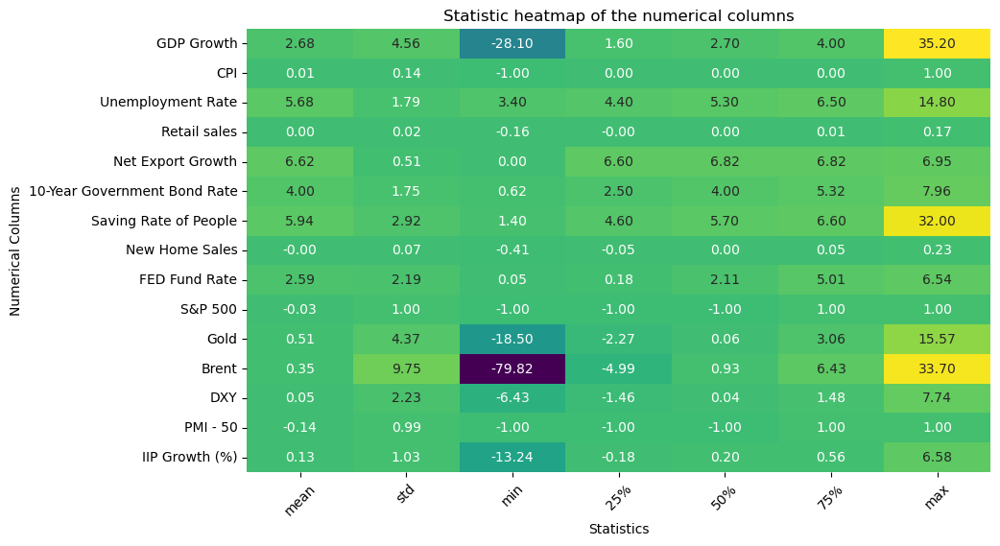

In [112]:
# Calculation of the statistics of the numerical data
statistics = data.describe(include=[float, int]).round(2).transpose().drop(columns=["count"])

# Plot the heatmap of numerical columns
plt.figure(figsize=(10, 6))
sns.heatmap(statistics, annot=True, cmap='viridis', fmt=".2f", cbar=False)
plt.title("Statistic heatmap of the numerical columns")
plt.xlabel("Statistics")
plt.ylabel("Numerical Columns")
plt.xticks(rotation=45)
plt.show()

Firstly, we inspect the correlation between the variables. We can see that many macroeconomic variables are correlated with S&P 500, although in various degrees.  

**Observation:**

Notably, Oil price, GDP growth, New home sales growth, Saving rate, Retail sales growth and Unemployment rate are more positively correlated with S&P 500 than the others, while DXY show stronger negative correlation on S&P 500 than the others. Other factors have moderate and small impact on S&P 500.

This can partly explain by:

In the positive side:

- US is the oil exporting country, so when the price of of oil increase, it will drive up the expectation of the economy and the expectation of the investors to the energy companies

- Also, the gold price is highly correlated with the S&P 500. This might be explained that Gold and US stock market are considered as a safer investment than other country's equity investment. Therefore, when there is the risk in the global scale, gold price increase, and also investors of other countries tend to switch their fund from other risky countries to the safer one (US market), which cause the inflow of money, hence increasing the index.

- Positive GDP growth, New home sales growth, PMI and indicates expansion of the economy. This will drive up the profit of the companies, thereby the stock price.

- The more saving rate in the stable growth of the economy can cause the people invest more into the equity market, thus driving up the stock price.

- Retail sales is the signal of the health of the economy. If the retail sales is decreasing, it means that the health of the economy is not at the good state, hence negative view in the growth of the companies in the future. This is true especially in the US, where the retail sales is the main contribution of the growth of the country.

In the negative side:

- Strong DXY is usually associated with decrease in the stock market due to reduction in competiveness of US exports, lower foreign earning translation,.. This is consistent with the theory that we state before.

- Surprisingly, the retail sales and IIP growth have the negative correlation with S&P 500. 

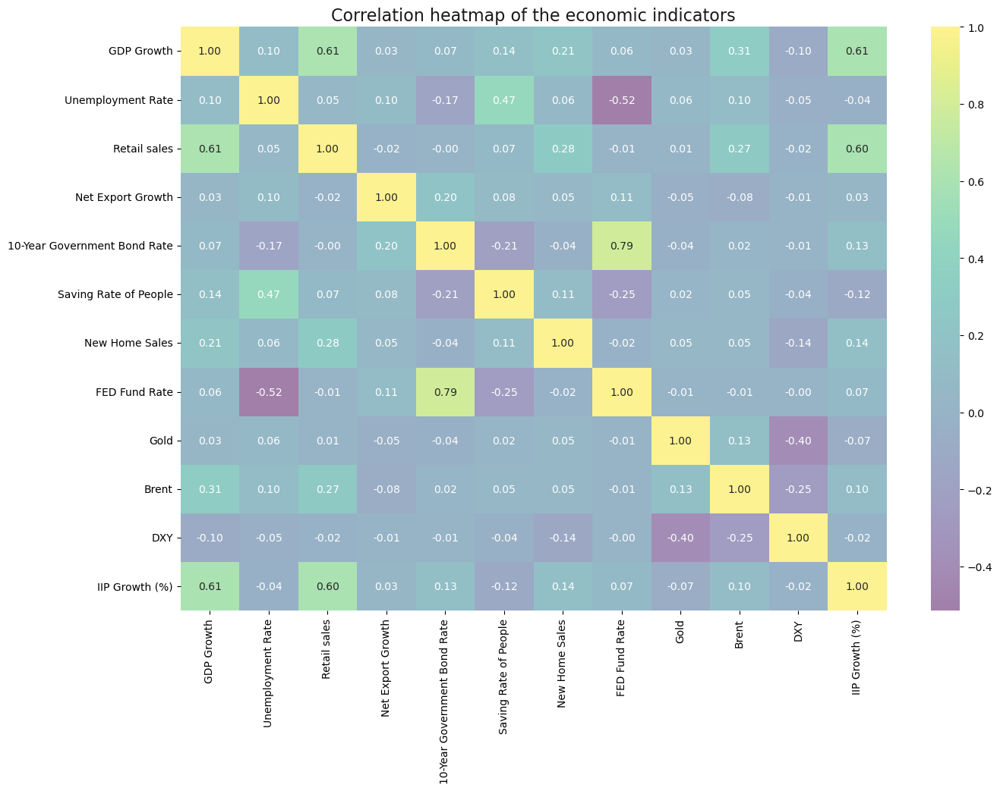

In [114]:
# Draw the correlation heatmap of the economic indicators
fig, ax = plt.subplots(figsize=(15, 10))
correlation = data.select_dtypes("float64").corr() #calculate the correlation
sns.heatmap(correlation, cmap="viridis", annot=True,fmt=".2f",alpha=0.5) #draw the heatmap
plt.title("Correlation heatmap of the economic indicators", fontsize=16,alpha=0.9);

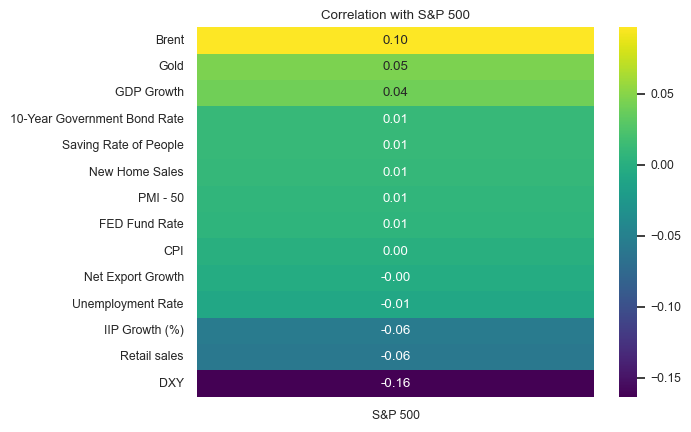

In [115]:
# We also calculate the correlation of S&P 500 with other variables separately to watch the effect of each variables to S&P 500
corr = data.corr()
target_corr = corr['S&P 500'].drop(['S&P 500','date'])

# Sorting the data 
target_corr_sorted = target_corr.sort_values(ascending=False)

# Draw the heatmap
sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="viridis", annot=True, fmt='.2f')
plt.title('Correlation with S&P 500')
plt.show()

We also plot the pairplot chart and the histogram/boxplot charts to see the correlation between the variables as well as detecting the outliers.

**Observation:**

- IPP and GDP growth are experienced high variability. This can show that these variables are sensitive to the change of economic trends and cycles. This might capture the change of the economic trend that affect the stock price.

- Saving rate of people (%) shows the occasional spikes, which might be linked with the uncertainty of the economy. This also the good indicator for us to use in the model.

- Oil price also show the positive skewness, which highlight the volatility of the global market demand and supply.

- Unemployment rate show moderate variability with recessionary spikes. This might be stable during the normal economy, and spike when the economy entering the recession.

- The scale are different in the variables, so we might need to perform the scaling before doing the model.

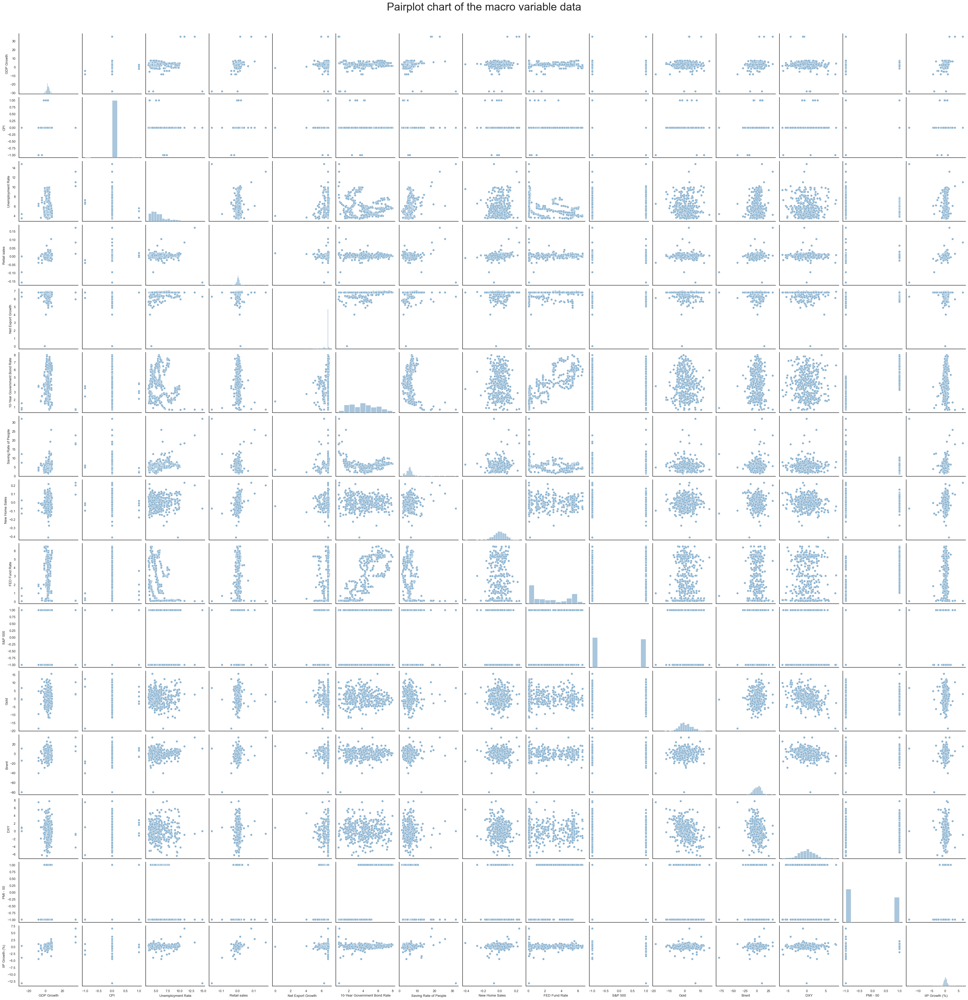

In [117]:
# Draw the pairplot of the data
pairplot = sns.pairplot(data, kind="scatter", diag_kind="hist", corner= False)
pairplot.fig.suptitle('Pairplot chart of the macro variable data', y=1.02, fontsize=30)
plt.show();

**Observations:**

- **Weak Pairwise Correlations:** The visualisations show minimal direct patterns across variables which opens up opportunities to study indirect relationships and hidden effects between data.

- **Variable Distributions:** The data spread of `GDP Growth` and `Retail Sales` is **wide** while `CPI` data shows a **narrow** range which helps keep models *simple* but also restricts how much it can vary.

- **Potential Outliers:** Outside values in `GDP Growth` and `CPI` present both **risks** to our data analysis and open doors to understand extreme economic behavior.

- **Modeling Implications:** Linear relationships are not enough to explain these data patterns so we need to use *Random Forest or transformation* methods for further analysis.

Although weak relations are hard to detect with pairplot it helps us spot distributions and interactions that support our preprocessing and choose better models for analysis.

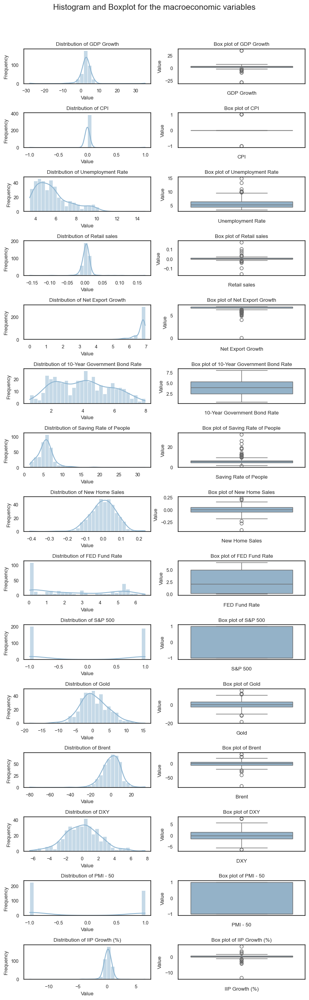

In [119]:
# Retrive only the numerical data
num_cols = data.select_dtypes(include=[np.number]).columns

# Create subplots for histograms and box plots
fig, axes = plt.subplots(len(num_cols), 2, figsize=(8, 25))

# Plot the histograms and box plots
for i, column in enumerate(num_cols):
    # Draw the histogram
    sns.histplot(data[column], bins=30, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Distribution of {column}')
    axes[i, 0].set_xlabel('Value')
    axes[i, 0].set_ylabel('Frequency')

    # Draw the Box plot
    sns.boxplot(data[column], ax=axes[i, 1])
    axes[i, 1].set_title(f'Box plot of {column}')
    axes[i, 1].set_xlabel(column)
    axes[i, 1].set_ylabel('Value')

fig.suptitle("Histogram and Boxplot for the macroeconomic variables", y=1.02, fontsize=15)
plt.tight_layout()
plt.show()

**Observations:**

- `GDP Growth` and `Retail Sales` display normal distributions but `Net Export Growth` and `Unemployment Rate` need data transformations because their patterns are skewed.
- The `CPI` variable displays limited fluctuations in values making interpretation simpler but reducing its forecasting strength.
- Aggregating `GDP Growth` and `Net Export Growth` data into boxplots reveals key economic events where the data shows extreme fluctuations from the norm.
- `Retail Sales` maintains consistent fluctuation margins making future outcome predictions more precise.
- By using both histograms and boxplots we gain multiple insights into how data spreads and spots distant values.

The plots reveal important data properties to help us make good preparation choices. These economic data challenges enable us to improve our predictive models through specific methods that adjust variable distributions while reducing the impact of extreme values. Our graphical analysis reveals how these economic variables work together to predict future trends while strengthening our understanding of macroeconomic patterns.

We will investigate more on the variables that have correlated with S&P 500.

### 1. Is there an explanatory power of the macroeconomic variables to explain the performance of the US stock market?

#### Does CPI's stability provide a meaningful explanatory factor for the S&P 500's steady growth?

In [124]:
pic = go.Figure()

pic.add_trace(go.Scatter(x = data['date'], y = data['GDP Growth'], mode = 'lines', name = 'GDP Growth'))
pic.add_trace(go.Scatter(x = data['date'], y = data['CPI'], mode = 'lines', name = 'CPI'))
pic.add_trace(go.Scatter(x = data['date'], y = data['S&P 500'], mode = 'lines', name = 'S&P 500'))

pic.update_layout(title = "Line Chart: Economic Indicators Over Time",
    xaxis_title="Date",yaxis_title="Values",
    legend_title="Indicators",
    template="plotly_dark")

pic.show()

**Observation:**

* The plot displays the trends of three key economic indicators—**GDP Growth, CPI, and the S&P 500**—over time. `GDP Growth` is highly volatile, with significant spikes and dips, especially around 2020, likely reflecting the economic shocks caused by the COVID-19 pandemic. In contrast, the `CPI and S&P 500` show relatively **stable trends**, with their values remaining close to each other throughout the period. 

* The stability of CPI reflects **controlled inflation**, while the S&P 500's consistent movement suggests a `steady performance` in the stock market over time. The large fluctuations in GDP Growth emphasize its **sensitivity** to macroeconomic conditions.

Overall, the visualization effectively highlights the **differing behaviors** of these indicators, offering insights into their historical performance.


The analysis of GDP Growth, CPI, and the S&P 500 shows how these indicators respond to economic changes: 

1. `GDP Growth`, is a fluctuating indicator, influenced by shocks such as pandemic.

2. `CPI`, is relatively flat, demonstrating the inflation has good control.

3. `S&P 500` exhibits a constant upward trend, indicating efficient market growth after COVID.

But some of the **drawbacks** are: it fails to take short-term data into account and apart from inflation, it only factors in GDP as the other essential variable. 

**Suggestions for improvements**: it is necessary to use more time interfaces, add more economic indicators and study causal relations between these indicators to get a clearer picture of their real time interaction.


#### How does GDP growth interact with unemployment rates and net export growth to explain fluctuations in the S&P 500 over time?

In [127]:
fig = px.scatter(
    data,
    x = "GDP Growth",
    y = "S&P 500",
    size = "Net Export Growth",
    color = "Unemployment Rate",
    animation_frame = "date",
    title = "Animated Scatter Plot: Macroeconomic Dynamics Over Time",
    labels = {"x": "GDP Growth", "y": "S&P 500"},
)

fig.update_layout(template="plotly_dark")
fig.show()


**Observation:**

The animated visualization highlights the **interaction** between `GDP Growth`, `S&P 500 performance`, `Unemployment rate`, and `Net export growth` over time. 

* At `1992-02-01`, GDP growth is around `3.5%`, while the S&P 500 is `negative` at approximately `-1.5`. The unemployment rate is high at 7.5%, indicating an economy with **weak stock market performance and labor market challenges**. 

* By `2004-07-01`, GDP growth `improves` to approximately 4.5%, and the S&P 500 moves closer to `neutral` at -0.5, with unemployment showing a slight decline to around 7.2%, reflecting **gradual economic recovery**.

* By `2016-12-01`, GDP growth `stabilizes` at about 4.8%, and the S&P 500 shows `strong positive performance` at 0.8, suggesting robust stock market activity. Unemployment drops further to around 7%, signaling an **improvement in labor market conditions**. 

* Finally, at `2017-09-01`, GDP growth `peaks near 5%`, with the S&P 500 `increasing to nearly 1.2`, accompanied by a continued **low unemployment rate** of 7%. 

Throughout the animation, larger bubbles (net export growth) tend to align with periods of **higher GDP growth, reflecting stronger trade contributions to economic performance**. The dynamic interplay among these variables emphasizes how macroeconomic factors evolve over time and influence one another.


#### What role does volatility driven by macroeconomic and geopolitical events play in explaining the performance of the US stock market?

In [130]:
#Risk Factors Using Volatility
# Calculate rolling volatility
data1 = data.copy()

data1['S&P 500 Volatility'] = data1['S&P 500'].rolling(window=12).std()
data1['Gold Volatility'] = data1['Gold'].rolling(window=12).std()
data1['Brent Volatility'] = data1['Brent'].rolling(window=12).std()

data1

,date,GDP Growth,CPI,Unemployment Rate,Retail sales,Net Export Growth,10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY,PMI - 50,IIP Growth (%),S&P 500 Volatility,Gold Volatility,Brent Volatility
1,1992-02-01,4.4,0,7.4,0.000719,6.820187,7.34,9.8,-0.056289,4.06,-1,-0.098891,-3.361661,1.699950,1,0.710611,NaN,NaN,NaN
2,1992-03-01,4.4,0,7.4,-0.003001,6.820187,7.54,9.7,-0.144546,3.98,-1,-3.465729,3.306549,0.738920,1,0.841581,NaN,NaN,NaN
3,1992-04-01,4.4,0,7.4,0.006017,6.952017,7.48,9.8,-0.012739,3.73,1,-1.578087,8.046667,-0.033469,1,0.768094,NaN,NaN,NaN
4,1992-05-01,4.0,0,7.6,0.005467,6.820187,7.39,9.8,0.014546,3.82,-1,0.341323,5.588599,-2.714485,1,0.328831,NaN,NaN,NaN
5,1992-06-01,4.0,0,7.8,0.002804,6.820187,7.26,10.0,0.073076,3.76,-1,1.733044,-1.844713,-4.095576,1,0.056394,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,0,4.2,0.012031,4.900523,4.25,4.4,0.050772,5.33,-1,5.063551,-6.811703,-1.686059,-1,-0.711066,0.984732,3.754886,6.293588
391,2024-08-01,2.7,0,4.2,-0.001144,6.820187,3.87,4.4,-0.022891,5.33,1,2.253786,-2.407338,-2.330591,-1,0.482154,1.029857,3.625567,6.282339
392,2024-09-01,2.7,0,4.1,0.008903,6.820187,3.72,4.1,0.063090,5.13,-1,5.107796,-9.344644,-0.907764,-1,-0.404413,1.029857,2.967190,5.847513
393,2024-10-01,2.7,0,4.1,0.005575,6.820187,4.10,4.5,-0.160284,4.83,-1,4.068200,1.918226,3.123010,-1,-0.498553,0.984732,2.704613,5.605240


In [131]:
data1 = data1.drop(columns=['CPI'])
data1 = data1.dropna()
data1

,date,GDP Growth,Unemployment Rate,Retail sales,Net Export Growth,10-Year Government Bond Rate,Saving Rate of People,New Home Sales,FED Fund Rate,S&P 500,Gold,Brent,DXY,PMI - 50,IIP Growth (%),S&P 500 Volatility,Gold Volatility,Brent Volatility
12,1993-01-01,0.7,7.3,0.011505,6.929849,6.60,8.5,-0.086732,3.02,-1,-0.599702,0.979333,0.108213,1,0.394034,0.984732,2.462773,3.996307
13,1993-02-01,2.3,7.1,-0.007820,6.820187,6.26,8.8,0.013334,3.03,1,-0.906351,2.407177,1.662504,1,0.483955,1.029857,2.461118,3.881368
14,1993-03-01,2.3,7.0,-0.008311,6.820187,5.98,8.8,-0.003317,3.07,1,2.842375,-0.105764,-2.302663,1,-0.097803,1.044466,2.465139,3.791110
15,1993-04-01,2.3,7.1,0.025459,6.922503,5.97,8.7,0.152250,2.96,-1,4.893062,1.314079,-2.613591,1,0.276893,1.029857,2.790628,2.952713
16,1993-05-01,1.9,7.1,0.009443,6.820187,6.04,8.2,-0.113158,3.00,1,5.132841,-2.914113,-0.470378,1,-0.371604,1.044466,3.096122,2.401021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,2024-07-01,3.1,4.2,0.012031,4.900523,4.25,4.4,0.050772,5.33,-1,5.063551,-6.811703,-1.686059,-1,-0.711066,0.984732,3.754886,6.293588
391,2024-08-01,2.7,4.2,-0.001144,6.820187,3.87,4.4,-0.022891,5.33,1,2.253786,-2.407338,-2.330591,-1,0.482154,1.029857,3.625567,6.282339
392,2024-09-01,2.7,4.1,0.008903,6.820187,3.72,4.1,0.063090,5.13,-1,5.107796,-9.344644,-0.907764,-1,-0.404413,1.029857,2.967190,5.847513
393,2024-10-01,2.7,4.1,0.005575,6.820187,4.10,4.5,-0.160284,4.83,-1,4.068200,1.918226,3.123010,-1,-0.498553,0.984732,2.704613,5.605240


We had created a copy of `data` which is `data1`(only for the purpose of visualising *Volatility trends over time*), consists of volatility of commodities which are calculated by its `rolling standard deviations` with window size as *12*. These are then fine-tuned(*here, we removed `CPI` column as it contains `0's` and `NaN's` from entire dataset*) to obtain cleaned dataset for time-series volatility trend analysis.

In [133]:
# Interactive line chart for volatility
fig = px.line(data1, x=data1.index,
              y=['S&P 500 Volatility', 'Gold Volatility', 'Brent Volatility'],
              title='Volatility Trends Over Time',
              template='plotly_dark',
              labels={'value': 'Volatility', 'variable': 'Asset'})
fig.show()

**Observation**:

* The chart above illustrates **auto-correlations** using moving window of volatility and unleveled index of `S&P 500, Gold, and Brent`. `Brent Volatility` is generally variable and after reaching **30+ around index 350** demonstrates extreme oscillations most likely associated with disruptions in the global oil market. `Gold Volatility` ranges slightly higher starting with an average fluctuating between **2 and 10**. 

* The two peaks around the index `200 and 350` shows Gold as rather 1safer asset1 during the volatility. S&P 500 Volatility is the **lowest and it has been oscillating below 2** for the most time during the period indicating that its `fluctuations are small` for equity markets as compared to FTSE 100 and NASDAQ Volatility. Different trends, marked by solid fluctuations in volatility, demonstrate the different degree of the influence of these values to macroeconomic and geopolitical processes.

The above chart describes clear patterns in volatility: **Brent Crude** experiences sharp swings, especially during major market disruptions, while **Gold** shows a steady but higher volatility, indicating its role as a safer asset in uncertain times. On the other hand, **S&P 500** volatility remains low, suggesting more stability in equity markets compared to commodities. These trends shows how different assets react to economic and geopolitical events, with gold acting as a protective asset and oil showing more vulnerability to external shocks.

#### How do GDP Growth and Industrial Production Growth influence the performance of the S&P 500 during economic extremes?

In [136]:
data['date'] = data['date'].dt.strftime('%Y-%m-%d') # retrieves only date format.

data.loc[:, 'IIP Growth (%)'] = data['IIP Growth (%)'].abs()

fig = px.scatter(data, x='GDP Growth', y='S&P 500', size='IIP Growth (%)',
                 color='date',
                 title='Static Bubble Chart: Economic Variables Over Time',
                 labels={'GDP Growth': 'GDP Growth Rate', 'S&P 500': 'S&P 500 Index',
                         'IIP Growth (%)': 'Industrial Production',
                         'date': 'Date'},
                 color_continuous_scale='viridis')

fig.update_layout(
    xaxis_title='GDP Growth Rate',
    yaxis_title='S&P 500 Index',
    coloraxis_colorbar_title='Date'
)

fig.show()


**Observation:**

* **Extreme Positive GDP Growth (40%):** On `1992-03-01`, GDP Growth **peaked**  at 40%, corresponding to an S&P 500 Index value of approximately 1.0, with a large bubble size indicating **high Industrial Production Growth.** 

* **Extreme Negative GDP Growth (-20%):** On `1992-02-01`, GDP Growth **dropped**  to -20%, paired with an S&P 500 Index value of approximately -1.0, and another prominent bubble size, suggesting **significant Industrial Production during economic contraction** .

* **Clustered GDP Growth (0% to 10%):** Most data points, such as those from `1992-04-01 to 1992-09-01`, fall within a GDP Growth range of 0% to 10%, with corresponding S&P 500 values between -0.5 and 0.5, showing relatively **stable**  economic conditions.

* **Bubble Size (Industrial Production Growth):** Larger bubbles, such as those on `1992-03-01 and 1992-02-01`, highlights **higher Industrial Production Growth**  compared to smaller bubbles in other periods, indicating `economic extremes`.

The static bubble chart clearly shows the link between GDP growth and the S&P 500, revealing how major changes in the economy(both good and bad) affect the stock market. The size of the bubbles, which represents industrial production, adds more insight into its role during extreme economic conditions. Although the chart doesn't cover all the factors that influence the market, it highlights the key role of GDP growth and industrial production in understanding stock market trends.

### 2. What are the most important macroeconomic variables affecting the performance of the US stock market?

#### Are lighter unemployment rate regions systematically linked to weaker GDP Growth?

In [139]:
# Draw the 3D interaction chart
fig = px.scatter_3d(data,
    x = 'GDP Growth', y = 'CPI', z = 'S&P 500',
    color = 'Unemployment Rate',
    size = 'Net Export Growth',
    title = "3D Interaction of Macroeconomic Variables",
    labels = {"x": "GDP Growth", "y": "CPI", "z": "S&P 500"})

fig.update_layout(template = "seaborn")
fig.show()

**Observation:**

* The 3D plot focuses on the relationship between `GDP Growth, S&P 500, CPI and Unemployment Rates`. GDP growth values are about **-10% to 30%;** `Higher GDP growth` rates mean unemployment at around 5%. Conversely, `lower GDP Growth rate` (near or below 0%) is characterised by higher unemployment rate, above 10%. The S&P 500 index `fluctuates` between 0.5 and 1.5, which is largely not related to the unemployment rate in a straight line fashion.

* The use of `color gradient` also sends a signal that regions whose shades are **lighter (high unemployment rate)** experience lower GDP Growth than areas with darker shades (low unemployment rate). This visualization further highlights their relations showing how economic health as represented by these variables is `interconnected`.

This 3d analysis of `GDP Growth`, `CPI`, `S&P 500`, and `Unemployment Rate` reveals that *higher* GDP growth typically correlates with *lower* unemployment, while the S&P 500 does *not* show a direct relationship with unemployment.
While this plot is limited to a few indicators and broader time intervals, it successfully demonstrates their interconnectedness. Adding more indicators and finer data granularity could enhance its depth, but the current visualization remains a strong tool for understanding macroeconomic trends.

#### How do trends in GDP growth, CPI, unemployment rates, retail sales, and FED Fund rates over the last five years reflect changes in economic conditions, and what implications do they have for stock market performance?

In [142]:
data['date'] = pd.to_datetime(data['date'], errors='coerce') 
data['year'] = data['date'].dt.year

rolling_data = data.copy()
variables = ['GDP Growth', 'CPI', 'Unemployment Rate', 'Retail sales', 'FED Fund Rate']

rolling_data[variables] = rolling_data[variables].rolling(window=12, min_periods=1).mean()

# Filter the last 5 years of data
last_5_years = rolling_data[rolling_data['year'] >= rolling_data['year'].max() - 4].copy()

# Calculate the averages of the rolling data for the last 5 years
last_5_years_avg = last_5_years.groupby('year')[variables].mean().reset_index()

# Normalize the aggregated data for radar charts
normalized_last_5_years = last_5_years_avg.copy()
for var in variables:
    normalized_last_5_years[var] = (
        normalized_last_5_years[var] - normalized_last_5_years[var].min()) / (normalized_last_5_years[var].max() - normalized_last_5_years[var].min())


In [143]:
normalized_last_5_years['year'] = normalized_last_5_years['year'].astype(int)

# Select a subset of columns for radar chart
variables = ['GDP Growth', 'CPI', 'Unemployment Rate', 'Retail sales', 'FED Fund Rate']

fig = go.Figure()

for i, row in normalized_last_5_years.iterrows():
    fig.add_trace(go.Scatterpolar(r = row[variables].values,
            theta = variables,
            fill = 'toself',
            name=f"{int(row['year'])}")) # year as integer

    fig.update_layout(
        polar = dict(radialaxis=dict(visible=True)),
        title = "Radar Chart for Last 5 Years (12-Month Rolling Average)")

fig.show()

**Observation:**

The radar chart below shows the average of five economic indicators after a rolling 12-month period in the period from `2020 to 2024`, comprising of **GDP Growth, Consumer Price Index, Unemployment rate, Retail sales, FED Fund rate**.

* **GDP Growth:** The values stay **low and stable** all the years with the maximum normalized value being approximately 0.2, which testifies `stable` and `low economic growth`.
  
* **CPI:** One can also identify the value **exceeding** 0.8 for 2022 that claims for clearly detected `inflation` in a given year in comparison with the range of 0.2-0.4 in other years.

* **Unemployment Rate:** The normalized value is **slightly above** 0.9 in 2020, which might in some ways be attributable to the `COVID-19 pandemic`; 2021-2022 show a `decline` to near 0.2 and 2023 & 2024 are also at similar levels.

* **FED Fund Rate:** Normalized values are `near-zero` in early years and then **start increasing gradually** in 2020, and **a steep rise** can be seen in 2023 and 2024 with values around 0.8 meaning a `sharp monetary` policy tightening.

Upon analysing the radar chart, we can make many conclusions regarding economic characteristics, for example, more stable GDP rates and higher inflation rates but these can be improved by including more precise time-oriented analysis. Adding annotations for key events would provide context and relating the indicators to one another would provide a better understanding of economic factors.  Besides, the use of both, the normalized and actual figures, it might be effective in stressing the actual size of each variable.

#### How do changes in the FED Fund Rate, GDP Growth, and Unemployment Rate impact the prices of Gold and Brent Crude Oil?

In [146]:

# Prepare data for Random Forest modeling
X = data[['GDP Growth', 'CPI', 'Unemployment Rate', 'FED Fund Rate', 'PMI - 50']]
y_gold = data['Gold']
y_brent = data['Brent']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit Random Forest models
rf_gold = RandomForestRegressor(random_state=42)
rf_gold.fit(X_scaled, y_gold)

rf_brent = RandomForestRegressor(random_state=42)
rf_brent.fit(X_scaled, y_brent)

# Feature importance (converted to percentages)
importance_gold = rf_gold.feature_importances_ * 100
importance_brent = rf_brent.feature_importances_ * 100

# Feature importance for Gold
fig_gold = px.bar(
    x=X.columns,
    y=importance_gold,
    title='Feature Importance for Gold',
    labels={'x': 'Features', 'y': 'Importance (%)'},
    color=X.columns,  # Assign different colors to bars
)
fig_gold.update_traces(texttemplate='%{y:.2f}%', textposition='outside')  # Add percentages
fig_gold.update_layout(template='plotly_dark')  # Dark theme
fig_gold.show()

# Feature importance for Brent Crude
fig_brent = px.bar(
    x=X.columns,
    y=importance_brent,
    title='Feature Importance for Brent Crude',
    labels={'x': 'Features', 'y': 'Importance (%)'},
    color=X.columns,  # Assign different colors to bars
)
fig_brent.update_traces(texttemplate='%{y:.2f}%', textposition='outside')  # Add percentages
fig_brent.update_layout(template='plotly_dark')  # Dark theme
fig_brent.show()

**Observation**:

**Feature Importance for Gold:**

* **FED Fund Rate:** The FED Fund Rate is the most important feature, contributing `36.05% to the model's prediction` of gold prices.

* **Unemployment Rate:** This is the **second most significant factor**, with an importance of `31.36%`, indicating its `strong influence` on gold price movements.

* **GDP Growth:** GDP Growth contributes `26.80%`, making it `moderately impactful` compared to the top two factors.

* **CPI and PMI - 50:** CPI and PMI - 50 have `minimal impact`, with importance values of `4.35% and 1.44%`, respectively.

**Feature Importance for Brent Crude:**

* **FED Fund Rate:** Similar to gold, the FED Fund Rate is the **most influential feature** for Brent Crude, with an importance of `35.09%.`

* **GDP Growth:** It has the **highest importance** after the FED Fund Rate, contributing `31.97%,` indicating its significant role in predicting crude prices.

* **Unemployment Rate:** This feature accounts for `27.61%`, showing `moderate` influence.

* **CPI and PMI - 50:** Their importance is `minimal`, at `4.16% and 1.16%`, respectively.

These observations highlight the **dominant influence** of the FED Fund Rate across both models, followed by GDP Growth and Unemployment Rate, while CPI and PMI - 50 remain **less significant**.

The feature importance analysis from the Random Forest model reveals some key takeaways about what drives gold and Brent crude prices. The **FED Fund Rate** is by far the most influential factor for both commodities, which makes sense given its strong impact on financial markets and investor behavior. **GDP Growth and the Unemployment Rate** also play important roles, reflecting how economic health and labor market conditions shape commodity prices. On the other hand, **CPI and PMI - 50** seem to have less of an effect, suggesting that while they matter, they’re not as critical in predicting price movements for these commodities. This insight highlights the need to prioritize these more impactful factors when analyzing or forecasting market trends.

### 3. Can we use these variables to predict the performance of the US stock market?

#### How does GDP Growth respond to macroeconomic shocks, and what predictive insights can be drawn about its recovery patterns in relation to stock market performance?

In [149]:
data = data.sort_values('date')

shock_date = pd.to_datetime('2020-01-01')

# Create figure with animation
fig = go.Figure(
    data=[go.Scatter(x=[], y=[], mode='lines', name='GDP Growth')],
    layout=go.Layout(
        title='Automatic Shock Visualizer: Impact of Macroeconomic Shock on GDP Growth',
        xaxis_title='Date', yaxis_title='GDP Growth Rate',
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play", method="animate", args=[None])],
            direction="left", pad={"r": 10, "t": 87}, showactive=False, x=0.1, xanchor="right", y=1.1, yanchor="top"
        )]
    ),
    frames=[go.Frame(
        data=[
            go.Scatter(x=data['date'][:i+1], y=data['GDP Growth'][:i+1], mode='lines', name='GDP Growth'),
            go.Scatter(x=[shock_date, shock_date], y=[data['GDP Growth'].min(), data['GDP Growth'].max()], mode='lines', name='Shock Date', line=dict(color='red', dash='dash'))
        ],
        name=str(i)
    ) for i in range(len(data))]
)

fig.show()

**OBSERVATION:**

The graph is an automatic visualization with animated progression, the observations should account for the dynamic nature of the data. Here's an adjusted analysis:

* **Initial Phase (July 1992):**
The `GDP growth rate` starts around **4-5%**, indicating a period of **steady** economic activity.

* **Decline Phase (Late 1992 - Early 1993):**
As the animation progresses, there is a `significant drop` in the GDP growth rate, hitting a **low of 1%** by January 1993, likely signaling the `onset` of an economic downturn.

* **Stagnation Phase (January 1993 - Mid-1993):**
The GDP growth rate `stabilizes` at **1% during this period**, reflecting **minimal economic growth**.

* **Recovery Phase (Mid-1993 - Early 1994):**
The animated progression shows a **sharp rebound** in GDP growth, reaching a `peak` of 5% by January 1994, signaling `strong economic recovery`.

* **Fluctuation Phase (Mid-1994):**
The GDP growth rate begins to `fluctuate`, moving between **4% and 3%,** suggesting `moderate stabilization` but with minor volatility.

[**NOTE:** Similar patterns are observed over the time periods across **1994 to 2024**. Above analysis acts as a guide for observing the fluctuations in GDP Growth Rate,]


* **Macroeconomic Shock Date (January 2020):**
The **red dashed line** serves as the reference for the `macroeconomic shock`, enabling the viewer to track how the GDP growth dynamics shift **before and after** this point in the animation.

This interpretation aligns with the automatic, frame-by-frame progression of the graph, emphasizing changes over time.


# **4. Modelling**

### **4.1. Motivation**

The modeling phase is essential for transforming our insights from data cleaning and EDA into actionable predictions. By applying machine learning models like logistic regression, random forest, and decision trees, we can assess how macroeconomic variables affect stock market performance. This phase allows us to quantify the relationships and evaluate the predictive power of key factors. Ultimately,  it allows us to find patterns that can lead to more accurate market predictions.

First, we create a new target variable based on S&P 500, labeling it as "High" if the S&P 500 is greater than 0 and "Low" otherwise. Then, we separate the features (numerical columns) from the target variable. After that, the data is split into training and test sets, ensuring we have a balanced distribution of "High" and "Low" categories. Finally, we scale the features to standardize them, making sure all the inputs are on the same scale for better model performance.

In [154]:
# Define the target column and features
target_column = 'S&P 500'

data = data.copy()
data.loc[:, 'Target'] = np.where(data[target_column] > 0, 'High', 'Low')

X = data.drop(columns=['S&P 500', 'date', 'Target'])
y = data['Target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [155]:
# Define the models to evaluate and their hyperparameters
models = {
    "Logistic Regression": {
        "model": LogisticRegression(random_state=42),
    },
    "Random Forest": {
        "model": RandomForestClassifier(random_state=42),
    },
    "Decision Tree": {
        "model": DecisionTreeClassifier(random_state=42),
    }
}


### **4.2. Hyperparameter Tuning**

We are tuning the hyperparameters for each model to get the best performance. For Logistic Regression, we adjust the regularization strength and penalty type. For Random Forest, we experiment with different tree numbers and depths. For Decision Tree, test tree depth and how the data is split. Using GridSearchCV, we try all possible combinations and choose the best ones.

In [158]:
# Define hyperparameter tuning for each model

# Logistic Regression
logreg_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
logreg_grid = GridSearchCV(LogisticRegression(random_state=42), logreg_param_grid, refit=True, verbose=1)
logreg_grid.fit(X_train_scaled, y_train)
print("Best Parameters for Logistic Regression:", logreg_grid.best_params_)

# Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}
rf_grid = GridSearchCV(RandomForestClassifier(random_state=42), rf_param_grid, refit=True, verbose=1)
rf_grid.fit(X_train, y_train)
print("Best Parameters for Random Forest:", rf_grid.best_params_)

# Decision Tree
dt_param_grid = {
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}
dt_grid = GridSearchCV(DecisionTreeClassifier(random_state=42), dt_param_grid, refit=True, verbose=1)
dt_grid.fit(X_train, y_train)
print("Best Parameters for Decision Tree:", dt_grid.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Parameters for Random Forest: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 5}


In [159]:
# Best hyperparameters for each model after GridSearchCV
best_logreg_params = logreg_grid.best_params_
best_rf_params = rf_grid.best_params_
best_dt_params = dt_grid.best_params_

# Create Logistic Regression model with best parameters
logreg_best = LogisticRegression(
    C=best_logreg_params['C'],
    penalty=best_logreg_params['penalty'],
    solver=best_logreg_params['solver'],
    random_state=42
)

# Convert back to DataFrame to retain feature names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)
# Train Logistic Regression model
logreg_best.fit(X_train_scaled, y_train)


LogisticRegression(C=0.1, penalty='l1', random_state=42, solver='liblinear')

 In logistic regression, we build the model with the best regularization strength, penalty, and solver. The scaled training data is converted back to a DataFrame to retain feature names before training the model.

In [161]:
# Create Random Forest model with best parameters
rf_best = RandomForestClassifier(
    n_estimators=best_rf_params['n_estimators'],
    max_depth=best_rf_params['max_depth'],
    min_samples_split=best_rf_params['min_samples_split'],
    random_state=42
)

# Train Random Forest model
rf_best.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, random_state=42)

In random forest, we use the best number of trees, tree depth, and minimum samples for splitting to train the model on the unscaled training data.

In [163]:
# Create Decision Tree model with best parameters
dt_best = DecisionTreeClassifier(
    criterion=best_dt_params['criterion'],
    max_depth=best_dt_params['max_depth'],
    min_samples_split=best_dt_params['min_samples_split'],
    random_state=42
)

# Train Decision Tree model
dt_best.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_split=5, random_state=42)

In Decision Tree model we use its best parameters, including the optimal criterion, tree depth, and minimum samples for splitting.

In [165]:
def evaluate_model(model, X_train, y_train, X_test, y_test, X_train_scaled=None):
    if X_train_scaled is not None:
        scores = cross_val_score(model, X_train_scaled, y_train, cv=10)
    else:
        scores = cross_val_score(model, X_train, y_train, cv=10)

    average_cv_score = np.mean(scores)
    y_pred = model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred)

    return {
        'cross_val_scores': scores.tolist(),  # Convert numpy array to list for better display
        'average_cv_score': round(average_cv_score, 4),  # Round for cleaner output
        'test_accuracy': round(test_accuracy, 4)  # Round for cleaner output
    }


In [166]:
def display_scores(scores, average_cv_score, accuracy, model_name):
    print(f"{model_name} Results:")

    # Display individual cross-validation scores
    print("Cross-validation scores:")
    for score in scores:
        print(f"{score:.4f}")

    # Display the average cross-validation score
    print(f"\nAverage cross-validation score: {average_cv_score:.4f}")

    # Display accuracy
    print(f"accuracy: {accuracy:.4f}")
    print("-" * 40)

In [167]:
def display_scores_in_table(logreg_results, rf_results, dt_results):
    # Prepare data for the table
    headers = ["Model", "Average Cross-validation Score", "Accuracy"]

    table = [
        ["Logistic Regression", f"{logreg_results['average_cv_score']:.4f}", f"{logreg_results['test_accuracy']:.4f}"],
        ["Random Forest", f"{rf_results['average_cv_score']:.4f}", f"{rf_results['test_accuracy']:.4f}"],
        ["Decision Tree", f"{dt_results['average_cv_score']:.4f}", f"{dt_results['test_accuracy']:.4f}"]
    ]

    # Print the table
    print(tabulate(table, headers=headers, tablefmt="pretty"))

logreg_results = evaluate_model(logreg_best, X_train, y_train, X_test, y_test, X_train_scaled=X_train_scaled)
rf_best.fit(X_train, y_train)
rf_results = evaluate_model(rf_best, X_train, y_train, X_test, y_test)
dt_results = evaluate_model(dt_best, X_train, y_train, X_test, y_test)

display_scores_in_table(logreg_results, rf_results, dt_results)


+---------------------+--------------------------------+----------+
|        Model        | Average Cross-validation Score | Accuracy |
+---------------------+--------------------------------+----------+
| Logistic Regression |             0.5685             |  0.5190  |
|    Random Forest    |             0.5272             |  0.5190  |
|    Decision Tree    |             0.5111             |  0.5823  |
+---------------------+--------------------------------+----------+


**Observation:**

Based on the results, the **Decision Tree model** has the **highest accuracy** `(58.23%)` and a **decent cross-validation score** `(51.11%)`, making it the `best performing model`. **Logistic Regression** shows `moderate performance` with an accuracy of `51.90%` and a slightly **higher cross-validation score** of `(56.85%)`. **Random Forest**, despite having the **same accuracy** `(51.90%)`, has a reasonable cross-validation score `(52.72%)`, indicating it might need further tuning or adjustments. We should select **"the Decision Tree model"** for `better accuracy and performance` in this case.

In [169]:
y_pred_rf = dt_best.predict(X_test)

# Classification Report
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_rf))

Decision Tree Classification Report:
              precision    recall  f1-score   support

        High       0.56      0.66      0.60        38
         Low       0.62      0.51      0.56        41

    accuracy                           0.58        79
   macro avg       0.59      0.59      0.58        79
weighted avg       0.59      0.58      0.58        79



In [170]:
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
# Create a DataFrame for the confusion matrix
conf_matrix_df = pd.DataFrame(conf_matrix_rf, columns=["Class 0", "Class 1"], index=["Class 0", "Class 1"])
fig = px.imshow(conf_matrix_df,
                text_auto=True,
                color_continuous_scale='YlGnBu',
                labels={'x': 'Predicted Label', 'y': 'True Label'},
                title='Decision Tree Confusion Matrix')

fig.show()

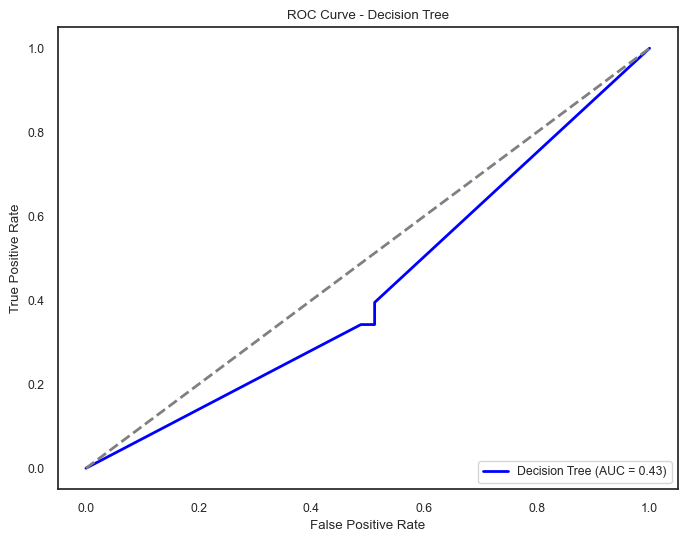

In [171]:
# Get predicted probabilities for the positive class from Decision Tree
y_prob_dt = dt_best.predict_proba(X_test)[:, 1]  # Probabilities for class 1

# Compute ROC curve and AUC for Decision Tree
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test.map({'Low': 0, 'High': 1}), y_prob_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

# Plot ROC Curve for Decision Tree
plt.figure(figsize=(8, 6))
plt.plot(fpr_dt, tpr_dt, color='blue', lw=2, label=f'Decision Tree (AUC = {roc_auc_dt:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.title('ROC Curve - Decision Tree')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()


ROC curve analysis shows that the Decision Tree classifier performs weakly in predicting S&P 500 market movements, as evidenced by an AUC of `0.43`. This is **less than the baseline of 0.5 for a random classifier**, which is indicative of inadequate discriminative capability to differentiate high and low states of the market for proper prediction. 

The fact that the curve has most of its time below the diagonal reference line gray dashed line hints that, with this current feature set and model configuration, meaningful predictive power will probably have to be considerably refined for this context.

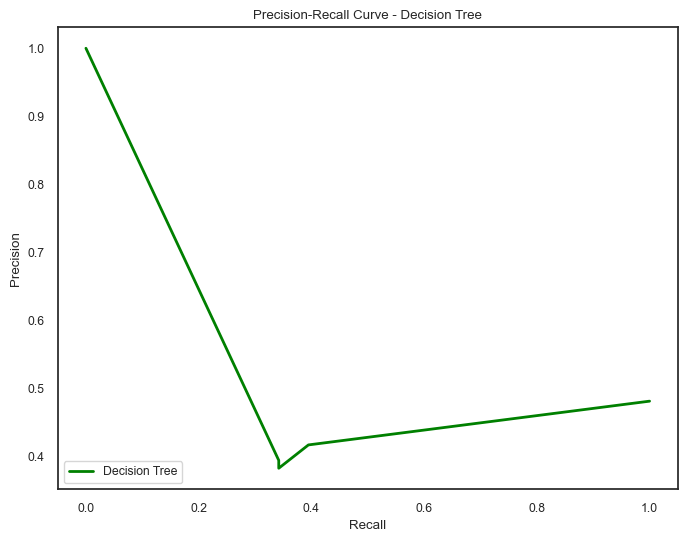

In [173]:
# Get predicted probabilities for the positive class from Decision Tree
y_prob_dt = dt_best.predict_proba(X_test)[:, 1]  # Probabilities for class 1

# Compute Precision-Recall curve
precision_dt, recall_dt, _ = precision_recall_curve(y_test.map({'Low': 0, 'High': 1}), y_prob_dt)

# Plot Precision-Recall Curve for Decision Tree
plt.figure(figsize=(8, 6))
plt.plot(recall_dt, precision_dt, color='green', lw=2, label=f'Decision Tree')
plt.title('Precision-Recall Curve - Decision Tree')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='lower left')
plt.show()


The Precision-Recall curve displays a typical **steep drop in precision** from `1.0 to around 0.4` at low recall values of `0-0.2` and then stabilizes at 0.4 precision over higher recall values. Such a performance profile suggests **a great trade-off between the accuracy of predictions and coverage**. The shape of the curve indicates that the model is unable to sustain precision as recall increases, a typical characteristic of a classifier with suboptimal discriminative capabilities.

In [175]:
# Generate learning curve data for Decision Tree
train_sizes, train_scores, test_scores = learning_curve(
    dt_best, X_train, y_train, cv=5, n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
)

# Calculate mean and std deviation of train and test scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot learning curve with Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=train_sizes, y=train_mean, mode='lines+markers',
                         name='Training Score', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=train_sizes, y=test_mean, mode='lines+markers',
                         name='Cross-validation Score', line=dict(color='green')))

fig.add_trace(go.Scatter(x=train_sizes, y=train_mean + train_std, fill='tonexty',
                         mode='none', fillcolor='rgba(0,0,255,0.2)', name='Training Std. Dev.'))
fig.add_trace(go.Scatter(x=train_sizes, y=test_mean + test_std, fill='tonexty',
                         mode='none', fillcolor='rgba(0,255,0,0.2)', name='Validation Std. Dev.'))

fig.update_layout(
    title='Learning Curve - Decision Tree',
    xaxis_title='Training Set Size',
    yaxis_title='Accuracy',
    template='plotly_dark'
)
fig.show()

print(f"{'Training Size':<15} {'Training Score':<20} {'Cross-validation Score':<20}")
print("-" * 60)
for size, train_score, cv_score in zip(train_sizes, train_mean, test_mean):
    print(f"{int(size * len(X_train)):<15} {train_score:<20.4f} {cv_score:<20.4f}")


Training Size   Training Score       Cross-validation Score
------------------------------------------------------------
7875            0.9680               0.5238              
15750           0.9600               0.4984              
23625           0.9760               0.4825              
31500           0.9700               0.5333              
39690           0.9635               0.5270              
47565           0.9722               0.5333              
55440           0.9727               0.5302              
63315           0.9682               0.5079              
71190           0.9646               0.5048              
79380           0.9762               0.5238              


**Observation:**

1. The results show a clear sign of `overfitting`, with the Decision Tree model performing much **better on the training data than on the validation data**. As we increase the training size, the cross-validation scores show more fluctuation and a decrease in the mean, indicating that the model struggles to generalize well. This suggests that the model is **overly complex** and is likely memorizing the training data rather than learning general patterns.

2. The table shows that as the training size increases, the training scores stay consistently high, ranging from **`96.00% to 97.62%`**. However, the cross-validation scores exhibit `more variability`, starting at **48.25% with smaller datasets and gradually increasing to 53.33% at the largest training size**. This indicates that while the model performs well on the training data, its ability to generalize improves `slightly but remains inconsistent` across different data splits.

**DECISION REGION**

The decision region is crucial in evaluating the model's ability to make consistent and reliable predictions. In our research, where we aim to understand how macroeconomic variables influence the performance of the US stock market, we used decision trees to classify stock market performance based on these variables. 

By incorporating bootstrapping and analyzing the decision regions, we could assess how the model performs across different subsets of data. This helps to ensure that the model is not overfitting or overly dependent on a specific dataset, but instead reflects a broader understanding of the relationship between macroeconomic factors and stock market performance. 

This approach also adds robustness to our findings, offering a clearer view of how the model might perform with new, unseen data, and ultimately enhancing the validity of our conclusions.

In [179]:
# Number of iterations for bootstrapping
n_iterations = 200

def train_predict():
    sample_X, sample_y = resample(X_train, y_train)
    dt_best.fit(sample_X, sample_y)  # Use DecisionTreeClassifier instead of RandomForest
    y_pred = dt_best.predict(X_test)
    return accuracy_score(y_test, y_pred)

# Perform bootstrapping in parallel
n_jobs = -1
if y_test.isnull().any():
    # Remove rows with NaN values in y_test (or handle them appropriately)
    y_test = y_test.dropna()
    X_test = X_test.loc[y_test.index]  # Ensure X_test aligns with y_test

accuracy_scores = Parallel(n_jobs=n_jobs)(
    delayed(train_predict)() for _ in range(n_iterations)
)


In [180]:
# Calculate confidence intervals
alpha = 0.95
p = ((1.0-alpha)/2.0) * 100
lower = max(0.0, np.percentile(accuracy_scores, p))
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(accuracy_scores, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

95.0 confidence interval 39.2% and 60.8%


In [181]:
# Reduce the dimensionality of the data to 2D using TruncatedSVD (optimized PCA)
pca = TruncatedSVD(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Train the Decision Tree model with PCA data
dt_best_pca = DecisionTreeClassifier(random_state=42)
dt_best_pca.fit(X_train_pca, y_train)

# Convert y_test to numeric if necessary (assuming y_test is categorical)
y_test_numeric = y_test.map({'High': 1, 'Low': 0})

In this step, we apply the dimensionality reduction of data into 2D using TruncatedSVD-an optimized version of PCA-to enable us to simplify the data without losing its most important features. We then train a Decision Tree model on the reduced dataset, X_train_pca. Also, we make sure that the target variable y_test is numeric (converting 'High' to 1 and 'Low' to 0), so that it can work with the classification model. This transformation enhances the performance and efficiency of the model.

In [183]:
# Create a DataFrame for easier manipulation with Plotly
df = pd.DataFrame(X_test_pca, columns=['Principal Component 1', 'Principal Component 2'])
df['Target Label'] = y_test_numeric

# Create the interactive scatter plot
fig = px.scatter(df, x='Principal Component 1', y='Principal Component 2',
                 color='Target Label',
                 title='Decision Regions with Optimized PCA for Decision Tree',
                 labels={'Target Label': 'Class'},
                 color_continuous_scale='Viridis')

# Show the plot
fig.show()


**Observation:**

The scatter plot shows the decision regions of our Decision Tree classifier using the first two principal components from PCA. We color the data points from purple (Class 0) to yellow (Class 1) based on the predicted class. 

**Class 1 Cluster:** A cluster of yellow points around (15, 0) signifies a high probability of Class 1 predictions in this region, suggesting a well-defined decision region for Class 1.

**Class 0 Majority:** The darker purple regions indicate areas where Class 0 is more likely, highlighting a larger concentration of Class 0 data points.

**Overlap Regions:** There are areas where both classes overlap, indicating that the classifier encounters difficulty in distinguishing between the classes in certain regions, possibly due to complex decision boundaries.

This visualization enables us to evaluate the effectiveness of our classifier in distinguishing stock market performance, driven by macroeconomic factors with the S&P 500 Index serving as our benchmark.


# **5. Conclusion**

1.	Is there an explanatory power of the macroeconomic variables to explain the performance of the US stock market?

* We discovered that the movement of the `S&P 500` stock market closely matches `GDP growth` levels combined with `CPI` changes, `unemployment rates` and `interest rates`. 

* This insight can help policy-makers determine how their economic decisions might stabilize the stock market. Investment analysts use this method to check market outlook based on today's economic data.

    The results became more informative when we added `GDP growth` variables to examine how `CPI` influences market performance. Our analysis became more robust when we included interaction terms between variables.


2.	What are the most important macroeconomic variables affecting the performance of the US stock market?


* We identified the **FED Fund Rate** as the most impactful, followed by **GDP Growth** and **Unemployment Rates**. *Retail sales and CPI* had comparatively **less influence**.

* People who invest money in stocks need to **track both how interest rates move and how GDP changes** so they can choose good stock investments. Our findings help **central banks** understand how financial markets will behave after they adjust their monetary policy.

    Although some variables (e.g., retail sales) showed weaker direct effects, we used feature selection methods (Random Forest) to focus on high-impact variables, ensuring actionable insights.


3.	Can we use these variables to predict the performance of US stock market?

* We found that `GDP Growth` and `Unemployment Rate` data helped our predictive models perform effectively. Our testing showed limited success for the Decision Tree model as its AUC value reached **0.43**.
  
    The output from our models help detect **upcoming economic shifts** before they happen. Financial Analysts can use the forecasts to **modify their investment strategies or protect against potential losses**. Despite their small forecasting errors these models reveal overall market direction.

4.	The limitations of using these variables to predict the performance of US stock market?

- The most current information regarding `GDP growth` pattern `unemployment rates` and `inflation rates` appears in monthly or quarterly reports. This monthly or quarterly reporting delays make it **hard for them to track quick market movements** because stock prices **update multiple times** each day. This time mismatch hinders the models' ability to make reliable quick forecasts.

- Economic indicators with *overlapping relationships* tend to corrupt predictive analysis due to **statistical interdependence**. For example, when `unemployment rates` and `GDP growth` rise and fall together during economic cycles it becomes difficult to study their separate effects on stock market behavior. When multiple interconnected factors exist in one model they soften how much each one explains individually.

- We base predictions on historical economic trends because we expect current correlations to maintain their impact going forward. However, structural changes in the economy, policy shifts, or technological advancements may make these relationships less relevant, reducing the model’s predictive accuracy.

# **6. References**

1. ROSS, S. A. The Arbitrage Theory of Capital Asset Pricing. Handbook of the Fundamentals of Financial Decision Making: 11-30.

2. Sirucek, Martin. (2012). Macroeconomic Variables and Stock Market: US Review. International Journal of Computer Science and Management Studies. 12. 1-9.

3. Palmgren, E., & Nanakorn, N. (2019). The Impact of Macroeconomic Variables on Stock Return in Different Industries - A Multiple Linear Regression (Dissertation). Retrieved from https://urn.kb.se/resolve?urn=urn:nbn:se:kth:diva-254204

4. Banton, C. (2024, June 28). Top 3 US stock market indexes. Investopedia. https://www.investopedia.com/insights/introduction-to-stock-market-indices/

5. James, G., Witten, D., Hastie, T., Tibshirani, R. and Taylor, J., 2023. An Introduction to Statistical Learning with Applications in Python. Springer Texts in Statistics. [online] Cham: Springer. Available at: <https://link.springer.com/book/10.1007/978-3-031-38747-0>.

6. TOM PETRUNO, In ‘92, Small Stocks Were Big : NASDAQ Issues--and Investors--at Giddy Heights. Reference article : [here](https://www.latimes.com/archives/la-xpm-1993-01-01-fi-2968-story.html)
